# connections_prob = 0.2


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import torch
import torchvision
import torchvision.transforms as transforms

import torchvision.transforms as transforms
from torchvision.datasets import MNIST
from torchvision.transforms import ToTensor
from torch_geometric.data import Data

from torch_geometric.nn import MessagePassing
from torch_geometric.utils import add_self_loops, degree

import torch.nn.init as init
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
from icecream import ic


from torch_scatter import scatter_mean
from torch_geometric.data import Data
from torch.utils.data import Dataset

from torch_geometric.loader import DataLoader
from torch_geometric.data import Data
import random

from torch_geometric.nn import MessagePassing
import torch.nn.functional as F
import os

seed_value = 42
torch.manual_seed(seed_value)

# Step 1: Load MNIST Data
transform_list = [
    transforms.ToTensor()
]
dataset_transform = ["normalize_mnist_mean_std"]

if "normalize_min1_plus1" in dataset_transform:
    transform_list.append(transforms.Normalize((0.5,), (0.5,)))

if "normalize_mnist_mean_std" in dataset_transform:
    transform_list.append(transforms.Normalize((0.1307,), (0.3081,)))

if "random_rotation" in dataset_transform:
    transform_list.append(transforms.RandomRotation(degrees=20))

# Create the transform
transform = transforms.Compose(transform_list)

mnist_trainset = torchvision.datasets.MNIST(root='data', train=True, download=True, transform=transform)
mnist_testset = torchvision.datasets.MNIST(root='data', train=False, download=True, transform=transform)

# Mock example

In [7]:
import torch
from torch.utils.data import Dataset
from torch_geometric.data import Data
import numpy as np
from torchvision.datasets import MNIST
from torchvision.transforms import ToTensor

class CustomGraphDataset(Dataset):
    def __init__(self, graph_params, mnist_dataset, supervised_learning, numbers_list,  
                 same_digit=False,
                 add_noise=False, noise_intensity=0.1, 
                 include_self_connections=False, N=2,
                 edge_index=None):
        self.mnist_dataset = mnist_dataset
        # self.graph_structure = graph_structure
        self.NUM_INTERNAL_NODES = graph_params["internal_nodes"]
        self.add_noise = add_noise
        self.noise_intensity = noise_intensity
        self.same_digit = same_digit
        self.supervised_learning = supervised_learning
        self.include_self_connections = include_self_connections
        self.N = N.lower() if type(N)==str else N

        if self.supervised_learning:
            print("Supervised learning")
        else:
            print("Un supervised learning")
        
        print(f"Taking first n={self.N} digits from each class")

        if numbers_list:
            self.numbers_list = numbers_list
        else:
            self.numbers_list = list(range(10))

        # Instead of storing just the first occurrence, store all occurrences of each digit
        self.indices = {int(digit): [] for digit in self.numbers_list}

        # Populate the indices dictionary with all occurrences of each digit
        for idx, (image, label) in enumerate(self.mnist_dataset):
            if int(label) in self.numbers_list:
                self.indices[int(label)].append(idx)

        # ------------------- Create the graph structure -------------------
        # FOR TESTING THE METHOD of MESSAGE PASSING
        # SENSORY_NODES = 10 # 784
        SENSORY_NODES = 784 # 784
        NUM_INTERNAL_NODES = self.NUM_INTERNAL_NODES 
        num_sensor_nodes    = range(SENSORY_NODES)
        num_internal_nodes  = range(SENSORY_NODES, SENSORY_NODES + NUM_INTERNAL_NODES)

        if self.supervised_learning:
            num_all_nodes = range(SENSORY_NODES + NUM_INTERNAL_NODES + 10)
        else:
            num_all_nodes = range(SENSORY_NODES + NUM_INTERNAL_NODES)

        if edge_index is not None:
            self.edge_index = edge_index
            self.edge_index_tensor = self.edge_index
        else:


            loader = GraphBuilder(**graph_params)
            
            self.edge_index = loader.edge_index
            self.edge_index_tensor = self.edge_index

            # self.NUM_INTERNAL_NODES_range = loader.INTERNAL
            # self.NUM_INTERNAL_NODES = sum(loader.num_internal_nodes)
            
          
            # Convert the edge list to a PyTorch tensor and transpose it to match the expected shape (2, num_edges)
            # self.edge_index_tensor = torch.tensor(edge_index, dtype=torch.long).t().contiguous()

        # # Initialize the weights for the edges
        # self.weights = torch.ones(self.edge_index_tensor.size(1))
        
        # # Convert to sparse representation
        # self.sparse_weights = torch.sparse.FloatTensor(self.edge_index_tensor, self.weights, torch.Size([len(num_all_nodes), len(num_all_nodes)]))

    def get_edge_weight(self, i, j):
        """
        Retrieve the weight of the edge from node i to node j.

        Parameters:
        i (int): Source node index.
        j (int): Target node index.

        Returns:
        float: Weight of the edge from node i to node j.
        """
        edge_indices = (self.edge_index_tensor[0] == i) & (self.edge_index_tensor[1] == j)
        if edge_indices.any():
            return self.weights[edge_indices.nonzero(as_tuple=True)[0]].item()
        else:
            return 0.0, False  # Return 0 if no such edge exists
        
    def __len__(self):
        return len(self.mnist_dataset)

    def __getitem__(self, idx):
        
        if self.same_digit:
            # fix idx to be the same digit
            selected_idx = 9
        else:
            digit = np.random.choice(self.numbers_list)
        
            # Randomly select an index from the list of indices for the selected digit
            digit_indices = self.indices[digit]

            if self.N == "all":
                self.N = len(digit_indices)
            digit_indices = digit_indices[0:self.N]
            selected_idx = np.random.choice(digit_indices)

        print("Selected idx: ", selected_idx)

        # Get the image and label from the dataset using the randomly selected index
        image, label = self.mnist_dataset[selected_idx]
        clean_image = image.clone()  # Store the clean image

        # Optionally add noise to the image
        if self.add_noise:
            noise = torch.randn(image.size()) * self.noise_intensity
            image = image + noise
            # Ensure the noisy image is still within valid range
            image = torch.clamp(image, 0, 1)
        

        # Initialize sensory nodes with image values
        if self.supervised_learning:
            # the sensory nodes are fixed to a 1-hot vector with the labels
            # we want outgoing edges from the label_nodes (1 hot of 10 classes) to the pixel nodes

            # Create a one-hot encoded vector of the label
            label_vector = torch.zeros(10)  # Assuming 10 classes for MNIST
            label_vector[label] = 10

            # Concatenate the label vector with the image vector
            # concat the image, internal nodes (zeros) and label nodes
            print("adding label", label, label_vector)

            values = torch.cat((image.view(-1, 1), torch.zeros(self.NUM_INTERNAL_NODES).view(-1, 1), label_vector.view(-1, 1)), dim=0)    
            # values = torch.cat((one_hot.view(-1, 1), torch.zeros(self.NUM_INTERNAL_NODES).view(-1, 1), label_vector.view(-1, 1)), dim=0)

            # x = torch.cat((image.view(-1, 1), label_vector.view(-1, 1)), dim=0)
        else:
            # Flatten image to use as part of the node features
            # NO: concat the image, internal nodes (zeros) and label nodes
            # YES: concat the image
            values = torch.cat((image.view(-1, 1), torch.zeros(self.NUM_INTERNAL_NODES).view(-1, 1)), dim=0)
            # values = torch.cat((one_hot.view(-1, 1), torch.zeros(self.NUM_INTERNAL_NODES).view(-1, 1)), dim=0)
            # x = image.view(-1, 1)

        # Node features: value, prediction, and error for each node
        errors = torch.zeros_like(values)
        predictions = torch.zeros_like(values)

        # Combine attributes into a feature matrix
        features = torch.stack((values, errors, predictions), dim=1)

        # assign the weights to the edges to be 1 
        edge_attr = torch.ones(self.edge_index_tensor.size(1))

        self.edge_attr = edge_attr

        return Data(x=features, edge_index=self.edge_index_tensor, y=label, edge_attr=edge_attr), clean_image.squeeze(0)
        # return Data(x=features, edge_index=self.edge_index_tensor, y=label), clean_image.squeeze(0)



# label_vector[label] = 100


In [46]:
# CustomGraphDataset params
dataset_params = {
    # "mnist_dataset":            mini,
    "mnist_dataset":            mnist_trainset,
    "supervised_learning":      True,
    "numbers_list":             [0, 1, 3, 4, 5, 6],
    # "NUM_INTERNAL_NODES":       ,
    "same_digit":               False,
    "add_noise":                False,
    "noise_intensity":          0.0,
    "include_self_connections": True,
    "N":                        20,     # taking the first n instances of each digit or use "all"
    "edge_index":               None,
} 


# Options: "fully_connected", "fully_connected_w_self", "barabasi", "stochastic_block", "fully_connected_no_sens2sup"
graph_params = {
    "internal_nodes": 1500,  # Number of internal nodes
    "supervised_learning": True,  # Whether the task involves supervised learning
    "graph_type": 

      {    
        "name": "stochastic_block", # Options: "fully_connected", "fully_connected_w_self", "barabasi", "stochastic_block", "fully_connected_no_sens2sup"
        "params":   
          {
            "num_communities": 50,      # Number of communities
            "community_size": 30,       # Size of each community
            "p_intra": 0.5,             # Probability of edges within the same community
            "p_inter": 0.1,             # Probability of edges between different communities
            "remove_sens_2_sup":True,
          }
      },


      # {    
      #   "name": "fully_connected_w_self", # Options: "fully_connected", "fully_connected_w_self", "barabasi", "stochastic_block"
      #   "params": None
      # },

      # {    
      #   "name": "fully_connected_no_sens2sup", # Options: "fully_connected", "fully_connected_w_self", "barabasi", "stochastic_block"
      #   "params": None
      # },
      
  
}

if graph_params["graph_type"]["name"] == "stochastic_block":
  assert graph_params["internal_nodes"] == (graph_params["graph_type"]["params"]["num_communities"] * graph_params["graph_type"]["params"]["community_size"])

# Define the graph type

# Initialize the GraphBuilder
custom_dataset_train = CustomGraphDataset(graph_params, **dataset_params)

dataset_params["batch_size"] = 4
dataset_params["NUM_INTERNAL_NODES"] = graph_params["internal_nodes"]
# dataset_params["NUM_INTERNAL_NODES"] = (custom_dataset_train.NUM_INTERNAL_NODES)

print("Device \t\t\t:", device)
print("SUPERVISED on/off \t", dataset_params["supervised_learning"])


Supervised learning
Taking first n=20 digits from each class
50 30 1500
Creating Stochastic Block Model graph
Device 			: cuda
SUPERVISED on/off 	 True


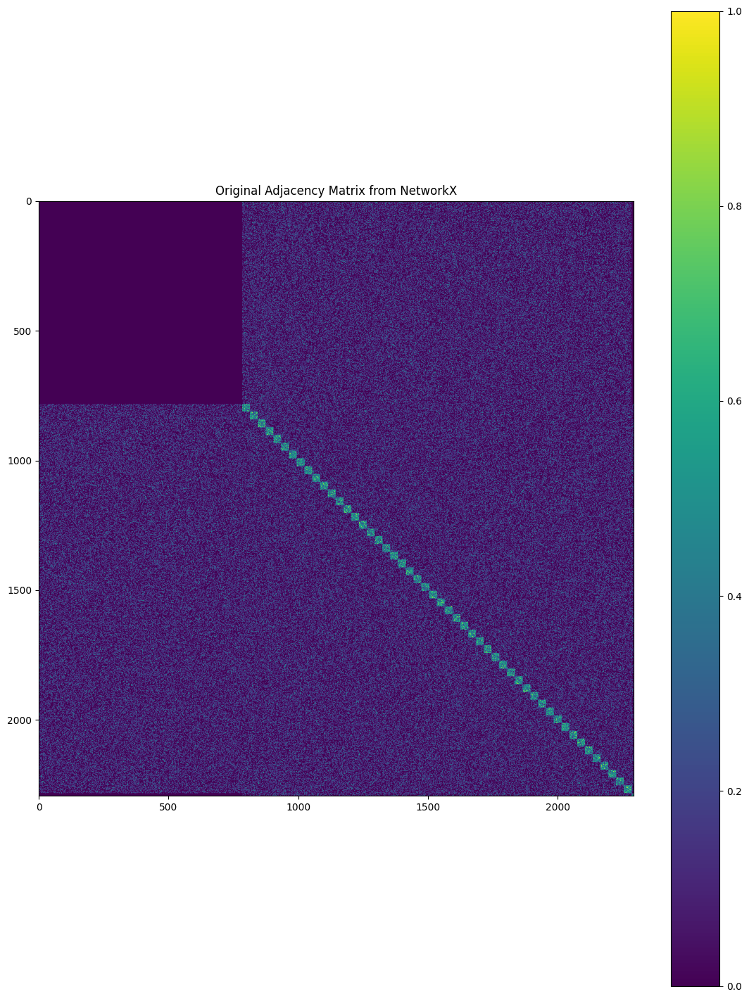

In [47]:
# Convert edge_index to adjacency matrix
adj_matrix_pyg = to_dense_adj(custom_dataset_train.edge_index)[0].numpy()
# adj_matrix_pyg = to_dense_adj(custom_dataset_train.edge_index_tensor)[0].numpy()

# Plot the adjacency matrices for visual comparison
plt.figure(figsize=(30, 18))

plt.subplot(1, 2, 1)
plt.imshow(adj_matrix_pyg, cmap='viridis')
plt.title("Original Adjacency Matrix from NetworkX")
plt.colorbar()

In [48]:

train_loader = DataLoader(custom_dataset_train, 
                          batch_size=dataset_params["batch_size"], 
                          shuffle=True, 
                        #   num_workers=4
                          )

img_size = 28*28
# num_vertices = img_size + NUM_INTERNAL_NODES  # Number of nodes in the graph
# sensory_indices = [i for i in range(0,img_size)]  # Assuming node 0 is a sensory node
# internal_indices = [i for i in range(img_size, num_vertices)]  # The rest are internal nodes

# NUM_INTERNAL_NODES = self.NUM_INTERNAL_NODES 
# num_sensor_nodes    = range(784)
# num_internal_nodes  = range(784, 784 + NUM_INTERNAL_NODES)
# num_label_nodes     = range(784 + NUM_INTERNAL_NODES, 784 + NUM_INTERNAL_NODES + 10)

# sensory_indices    = range(784)

# NUM_SENSORY = 10 
NUM_SENSORY = 784
sensory_indices    = range(NUM_SENSORY)


internal_indices   = range(NUM_SENSORY, NUM_SENSORY + dataset_params["NUM_INTERNAL_NODES"])
num_vertices = NUM_SENSORY + dataset_params["NUM_INTERNAL_NODES"]  # Number of nodes in the graph
supervised_labels = None

if dataset_params["supervised_learning"]:
    label_indices     = range(NUM_SENSORY + dataset_params["NUM_INTERNAL_NODES"], NUM_SENSORY + dataset_params["NUM_INTERNAL_NODES"] + 10)
    supervised_labels = label_indices
    num_vertices += 10

print("sensory_indices\t\t:", len(sensory_indices), sensory_indices[0], "...", sensory_indices[-1])
print("internal_indices\t:", len(internal_indices), internal_indices[0], "...", internal_indices[-1])
print("num_vertices \t\t:", num_vertices)

if dataset_params["supervised_learning"]:
  assert num_vertices == len(sensory_indices) + len(internal_indices) + 10, "Number of vertices must match the sum of sensory and internal indices + labels"
else:
  assert num_vertices == len(sensory_indices) + len(internal_indices), "Number of vertices must match the sum of sensory and internal indices"


sensory_indices		: 784 0 ... 783
internal_indices	: 1500 784 ... 2283
num_vertices 		: 2294


In [49]:
print(train_loader.batch_size)
for batch, clean_image in train_loader:
    
    values, errors, predictions = batch.x[:, 0], batch.x[:, 1], batch.x[:, 2]
  
    x, edge_index, y, edge_weight = batch.x, batch.edge_index, batch.y, batch.edge_attr
    print("edge_index", edge_index.shape)

    print(batch.x[:, 0].shape)
    print(custom_dataset_train.edge_index.shape)
    break

4
Selected idx:  107
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  47
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  83
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  166
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
edge_index torch.Size([2, 1922092])
torch.Size([9176, 1])
torch.Size([2, 480523])


The dataloader contains the two graphs into a single network with to disconnected graphs. It also concats the edge_index vectors together so, actually with doing batch learning we are storing and computing the edge weights. 

torch.Size([9176, 9176])


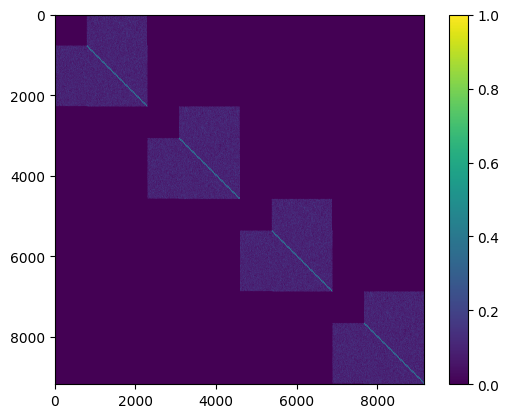

In [50]:
from torch_geometric.utils import to_dense_adj, dense_to_sparse

# Convert edge_index to a dense adjacency matrix
adj_matrix = to_dense_adj(edge_index).squeeze(0)
print(adj_matrix.shape)

plt.imshow(adj_matrix)
plt.colorbar()
plt.show()

<!-- <p> with and without self-connection    | (sensory to sensory)  -->

# MessagePassing 

In [14]:
from typing import Any
from torch_geometric.nn import GCNConv
# ------------------------------------------

import torch
from typing import Any

class Swish:
    def forward(self, x):
        return x * torch.sigmoid(x)

    def f_prime(self, x):
        # Derivative of Swish: sigmoid(x) + x * sigmoid(x) * (1 - sigmoid(x))
        sigmoid_x = torch.sigmoid(x)
        return sigmoid_x + x * sigmoid_x * (1 - sigmoid_x)



def set_activation(activation):
    
    swish = Swish()

    activation_functions = {
        "tanh": torch.tanh,
        "relu": torch.relu,
        "leaky relu": torch.nn.functional.leaky_relu,  # Note: requires passing an additional argument for the negative slope, handled below
        "linear": lambda x: x,
        "sigmoid": torch.sigmoid,
        "hard_tanh": torch.nn.Hardtanh(min_val=-1.0, max_val=1.0, inplace=False, min_value=None, max_value=None),
        "swish": swish.forward,
    }

    derivative_functions = {
        "tanh": lambda x: 1 - torch.tanh(x)**2,
        "relu": lambda x: torch.where(x > 0, torch.ones_like(x), torch.zeros_like(x)),
        "leaky relu": lambda x: torch.where(x > 0, torch.ones_like(x), 0.1 * torch.ones_like(x)),
        "linear": lambda x: torch.ones_like(x),
        "sigmoid": lambda x: torch.sigmoid(x) * (1 - torch.sigmoid(x)),
        "hard_tanh": lambda x: torch.where((x >= -1.0) & (x <= 1.0), torch.ones_like(x), torch.zeros_like(x)), 
        "swish": swish.f_prime
    }
    if activation not in activation_functions:
        raise NotImplementedError(f"Invalid activation function: {activation}. Supported activations are: {', '.join(activation_functions.keys())}")

    # Special-handling for "leaky relu" to pass the negative_slope parameter
    if activation == "leaky relu":
        f = lambda x: activation_functions[activation](x, negative_slope=0.1)
    else:
        f = activation_functions[activation]

    f_prime = derivative_functions[activation]

    return f, f_prime


In [15]:
import torch
from torch_geometric.nn import MessagePassing



class PredictionMessagePassing(MessagePassing):
    def __init__(self, aggr='add', activation=None):
        super(PredictionMessagePassing, self).__init__(aggr=aggr,flow="source_to_target")
        # Initialize the activation function and its derivative
        self.f, self.activation_derivative = set_activation(activation)

        # GET THIS with init. the 
        # self.edge_index = edge_index

    def forward(self, x, edge_index, weight_matrix):
        # x: Node features (values, errors, predictions)
        # edge_index: Graph connectivity (2, num_edges)
        # edge_weight: Edge weights (num_edges,)

        # Perform message passing
        # μi,t = ∑_j θj,i * f(xj,t)

        # need to have  num_nodes,3 (features) not N,3,1 
        if x.dim() == 3 and x.size(2) == 1:
            x = x.squeeze(2)  # Now x should have shape (num_nodes, 3)

         # Step 3: Compute normalization.
        # row, col = edge_index
        # deg = degree(col, x.size(0), dtype=x.dtype)
        # deg_inv_sqrt = deg.pow(-0.5)
        # deg_inv_sqrt[deg_inv_sqrt == float('inf')] = 0
        # norm = deg_inv_sqrt[row] * deg_inv_sqrt[col]

        # row, col = edge_index
        # thetaIJ = weight_matrix[row, col]  # Use the weight from the 2D matrix
        # thetaJI = weight_matrix[col, row]  # Use the weight from the 2D matrix

        # print("theta_ji pred", thetaJI)


        return self.propagate(edge_index, x=x, weight_matrix=weight_matrix, norm=None)

        # return self.propagate(edge_index, x=x, edge_weight=edge_weight, norm=norm)

    def message(self, x_j, weight_matrix, norm):
        # x_j: Node features of the neighboring nodes
        # edge_weight: Weights of the edges

        # Compute the message for each edge, which is the weighted activated value of the neighboring node

        # COMPUTES θj,i * f(xj,t) for each edge
        
        # return thetaJI * self.activation(x_j[:, 0]).view(-1, 1)

               
        return weight_matrix.view(-1, 1) * self.f(x_j[:, 0]).view(-1, 1)
        # return norm.view(-1, 1) * edge_weight.view(-1, 1) * self.activation(x_j[:, 0]).view(-1, 1)

    def update(self, aggr_out, x):
        # aggr_out: Aggregated messages for each node
        # x: Node features (values, errors, predictions)

        # Extract current values, errors, and predictions
        # values, errors, predictions = x[:, 0], x[:, 1], x[:, 2]

        # Update predictions based on aggregated messages
        # μi,t is updated with the aggregated message
        predictions = aggr_out

        return predictions.view(-1,1)
       


import torch
from torch_geometric.nn import MessagePassing

class ValueMessagePassing(MessagePassing):
    def __init__(self, aggr='add', activation=None):
        super(ValueMessagePassing, self).__init__(aggr=aggr, flow="source_to_target")
        # Initialize the activation function and its derivative
        self.activation, self.f_prime = set_activation(activation)

    def forward(self, x, edge_index, weight_matrix):
        # x: Node features (values, errors, predictions)
        # edge_index: Graph connectivity (2, num_edges)
        # edge_weight: Edge weights (num_edges,)

        # need to have  num_nodes,3 (features) not N,3,1 
        if x.dim() == 3 and x.size(2) == 1:
            x = x.squeeze(2)  # Now x should have shape (num_nodes, 3)

        # Perform message passing

        # row, col = edge_index
        # theta_ij = weight_matrix[row, col]      # Use the weight from the 2D matrix
        # thetaJI = weight_matrix[col, row]       # Use the weight from the 2D matrix

        # print("theta_ji", thetaJI)
        return self.propagate(edge_index, x=x, weight_matrix=weight_matrix)

    def message(self, x_j, weight_matrix):
        # x_j: Node features of the neighboring nodes (source nodes in edge_index)
        # x_i: Node features of the destination nodes in edge_index
        # edge_weight: Weights of the edges

        # Compute the message for each edge, which is the error times the edge weight
        # ε_{k,t} θ_{k,i}
        # errors_j = x_j[:, 1].view(-1, 1)  # Errors of the source nodes
        # return edge_weight.view(-1, 1) * errors_j

        errors_j = x_j[:, 1].view(-1, 1)
        return weight_matrix.view(-1, 1) * errors_j


    def update(self, aggr_out, x):
        # aggr_out: Aggregated messages for each node
        # x: Node features (values, errors, predictions)

        # Extract current values and errors
        values, errors = x[:, 0], x[:, 1]

        # Compute the derivative of the activation function applied to the values
        f_prime_x_i = self.f_prime(values).view(-1, 1)

        # Compute the change in values using the provided equation
        # Δx_{i,t} = γ (-ε_{i,t} + f'(x_{i,t}) ∑_k ε_{k,t} θ_{k,i})
        delta_x = (-errors.view(-1, 1) + f_prime_x_i * aggr_out)

        return delta_x.view(-1,1)

### Verification of Prediction Message Passing

**Objective:**  
To verify that the `PredictionMessagePassing` class correctly implements the message-passing mechanism for updating node predictions according to the rules defined in the paper.

**What We Are Verifying:**
1. **Message Calculation:**
   - For each node $i$, the predicted value $\mu_{i,t}$ should be calculated as:
     $$
     \mu_{i,t} = \sum_{j} \theta_{j,i} f(x_{j,t})
     $$
   - Here, $\theta_{j,i}$ is the weight of the edge from node $j$ to node $i$, and $f(x_{j,t})$ is the activation function applied to the value at node $j$.

2. **Expected Outcome:**
   - The output of the `PredictionMessagePassing` should match the manually calculated expected predictions for each node based on the incoming messages from connected nodes.

### Verification of Value Message Passing

**Objective:**  
To verify that the `ValueMessagePassing` class correctly implements the message-passing mechanism for updating node values according to the rules defined in the paper.

**What We Are Verifying:**
1. **Value Update Calculation:**
   - For each node $i$, the change in its value $\Delta x_{i,t}$ should be calculated as:
     $$
     \Delta x_{i,t} = \gamma \left(-\epsilon_{i,t} + f'(x_{i,t}) \sum_{k} \epsilon_{k,t} \theta_{k,i}\right)
     $$
   - Here, $\gamma$ is a learning rate, $\epsilon_{i,t}$ is the prediction error, and $f'(x_{i,t})$ is the derivative of the activation function applied to the value at node $i$.

2. **Expected Outcome:**
   - The output of the `ValueMessagePassing` should match the manually calculated expected updates for each node's value based on the incoming errors from connected nodes.


For testing we take 3 node with each fixed value, but every time a different act. function and edge weights

In [16]:
activation_functions = [
    "tanh",
    "relu",
    "leaky relu",
    "linear",
    "sigmoid",
    "hard_tanh",
    "swish"]

In [17]:
import torch

def verify_prediction_message_passing(activation_functions):

    act = random.choice(list(activation_functions))
    print("Using activation function: ", act)

    # Node features: (values, errors, predictions)
    node_values = torch.tensor([[1.0], [0.5], [0.3]])
    node_errors = torch.tensor([[0.1], [0.2], [0.4]])
    node_preds = torch.tensor([[0.2], [0.3], [0.5]])
    
    # Combine them into a single tensor
    x = torch.cat((node_values, node_errors, node_preds), dim=1)
  
    edge_index = torch.tensor([[0, 1, 2], [1, 2, 0]])  # Edge connections
    
    # Define edge weights corresponding to the edges in edge_index
    # edge_weights = torch.tensor([1.0, 0.8, 0.5])  # Edge weights for edges 0->1, 1->2, 2->0
    # random edge weights 
    edge_weights = torch.randn(3)

    # Instantiate the PredictionMessagePassing with ReLU activation
    mp = PredictionMessagePassing(activation=act)
    output = mp(x, edge_index, edge_weights)

    # Manually calculate expected outputs based on the update rule from the paper
    f, f_prime = set_activation(act)

    expected_output = torch.zeros(x.size(0), 1)
    
    for i in range(x.size(0)):
        incoming_edges = (edge_index[1] == i).nonzero(as_tuple=True)[0]
        messages = []
        for edge in incoming_edges:
            src_node = edge_index[0, edge].item()
            weight = edge_weights[edge].item()
            messages.append(weight * f(x[src_node, 0]).item())
        expected_output[i, 0] = sum(messages)

    # Check if output matches the expected values based on the paper's formula
    print("Prediction Message Passing Output:\n", output)
    print("Expected Output:\n", expected_output)

    assert torch.allclose(output, expected_output, atol=1e-5), "PredictionMessagePassing output does not match the expected output."

# Run verification tests
verify_prediction_message_passing(activation_functions)

Using activation function:  hard_tanh
Prediction Message Passing Output:
 tensor([[0.1605],
        [0.4617],
        [0.1337]])
Expected Output:
 tensor([[0.1605],
        [0.4617],
        [0.1337]])


In [18]:
import torch

def verify_value_message_passing(activation_functions):

    act = random.choice(list(activation_functions))
    print("Using activation function", act)
    # Define node features: (values, errors, predictions)
    node_values = torch.tensor([[1.0], [0.5], [0.3]])
    node_errors = torch.tensor([[0.1], [0.2], [0.4]])
    node_preds = torch.tensor([[0.2], [0.3], [0.5]])
    
    # Combine them into a single tensor
    x = torch.cat((node_values, node_errors, node_preds), dim=1)
    
    # Define the edge index and edge weights
    edge_index = torch.tensor([[0, 1, 2], [1, 2, 0]])  # Edge connections
    edge_weights = torch.tensor([1.0, 0.8, 0.5])  # Edge weights for edges 0->1, 1->2, 2->0

    # Instantiate the ValueMessagePassing with ReLU activation
    mp = ValueMessagePassing(activation=act)
    output = mp(x, edge_index, edge_weights)

    # Manually calculate expected updates based on the update rule from the paper
    f, f_prime = set_activation(act)

    expected_output = torch.zeros(node_values.size(0), 1)
    
    for i in range(node_values.size(0)):
        incoming_edges = (edge_index[1] == i).nonzero(as_tuple=True)[0]
        aggr_message = 0.0
        for edge in incoming_edges:
            src_node = edge_index[0, edge].item()
            weight = edge_weights[edge].item()
            aggr_message += weight * node_errors[src_node, 0].item()
        
        # Calculate the update for the node value
        f_prime_x_i = f_prime(node_values[i, 0])
        expected_output[i, 0] = -node_errors[i, 0] + f_prime_x_i * aggr_message

    # Check if output matches the expected updates based on the paper's formula
    print("Value Message Passing Output:\n", output)
    print("Expected Output:\n", expected_output)

    assert torch.allclose(output, expected_output, atol=1e-5), "ValueMessagePassing output does not match the expected output."

# Run verification tests
verify_value_message_passing(activation_functions)

Using activation function tanh
Value Message Passing Output:
 tensor([[-0.0160],
        [-0.1214],
        [-0.2536]])
Expected Output:
 tensor([[-0.0160],
        [-0.1214],
        [-0.2536]])


___

PyG automatically takes care of batching multiple graphs into a single giant graph with the help of the torch_geometric.loader.DataLoader class. Internally, DataLoader is just a regular PyTorch torch.utils.data.DataLoader that overwrites its collate() functionality, i.e., the definition of how a list of examples should be grouped together. Therefore, all arguments that can be passed to a PyTorch DataLoader can also be passed to a PyG DataLoader, e.g., the number of workers num_workers.



Batch of N items: 

<b> Errors: </b>  |---graph1---|---graph2---|---...---|---graph_N---| 


<b> Values: </b>  |---graph1---|---graph2---|---...---|---graph_N---|  


<b> Predictions: </b>  |---graph1---|---graph2---|---...---|---graph_N---|





In its most general form, the PyG DataLoader will automatically increment the edge_index tensor by the cumulated number of nodes of all graphs that got collated before the currently processed graph, and will concatenate edge_index tensors (that are of shape [2, num_edges]) in the second dimension. The same is true for face tensors, i.e., face indices in meshes. All other tensors will just get concatenated in the first dimension without any further increasement of their values.

<b> Edge Index : </b>  |---graph1---|---graph2---|---...---|---graph_N---|




# MODEL

In [19]:
import torch.nn as nn

class PCGraphConv(torch.nn.Module): 
    def __init__(self, num_vertices, sensory_indices, internal_indices, 
                 learning_rate, T, graph_structure, include_self_connections, 
                 batch_size, use_learning_optimzer, weight_init, clamping,
                 supervised_learning=False, debug=False, activation=None, 
                 log_tensorboard=True, device="cpu"):
        super(PCGraphConv, self).__init__()  # 'add' aggregation
        self.num_vertices = num_vertices
        self.sensory_indices = sensory_indices
        self.internal_indices = internal_indices
        
        self.gamma, self.alpha = learning_rate  
        self.lr_values , self.lr_weights = self.gamma,  self.alpha

        self.T = T  # Number of iterations for gradient descent

        self.debug = debug
        self.edge_index_single_graph = graph_structure  # a geometric graph structure
        self.mode = ""
        self.include_self_connections = include_self_connections

        self.supervised_labels = supervised_learning 
        self.task = None
        self.device = device
        self.weight_init = weight_init
        self.internal_clock = 0
        self.clamping = clamping

        self.energy_vals = {
            "internal_energy": [],
            "sensory_energy": [],
            "supervised_energy": []
        }

        self.values_at_t = []
        
        self.TODO = """ 
                    - think about removing self loops
                    - requires_grad=False for values and errors
                    - understand aggr_out_i, aggr_out is the message passed to the update function
                    """
        self.log = {"Zero_pred" : [], }   # Zero prediction error encountered for node {vertex}

        if self.debug:
            ic.enable()
        else: 
            ic.disable()
        # assert num_vertices == len(sensory_indices) + len(internal_indices), "Number of vertices must match the sum of sensory and internal indices"

        self.batchsize = batch_size
        # TODO use torch.nn.Parameter instead of torch.zeros
        
        self.use_optimzers = use_learning_optimzer

        self.grad_accum_method = "mean" 
        assert self.grad_accum_method in ["sum", "mean"]
        
        # Initialize weights with uniform distribution in the range (-k, k)

        # ------------- init weights -------------------------- 

        # https://pytorch.org/docs/stable/generated/torch.nn.Linear.html
        import math 
        k = 1 / math.sqrt(num_vertices)

        # USING BATCH SIZE, we want the same edge weights at each subgraph of the batch
        self.weights = torch.nn.Parameter(torch.zeros(self.edge_index_single_graph.size(1), device=self.device))
        # init.uniform_(self.weights.data, -k, k)

        VAL = 0.001
        # VAL = 0.005
        k = 10* (1 / self.num_vertices)
        print("VAL VS K", VAL, k)
        # nn.init.uniform_(self.weights, -k, k)
        self.weights.data = torch.full_like(self.weights.data, VAL)


        # https://chatgpt.com/c/0f9c0802-c81b-40df-8870-3cea4d2fc9b7

        
        # single_graph_weights = torch.nn.Parameter(torch.zeros(edge_index.size(1) // self.batchsize,  device=self.device), requires_grad=False)
        # init.uniform_(single_graph_weights, -k, k)
        # # Repeat weights across the batch
        # self.weights = single_graph_weights.repeat(self.batchsize)

        # single_graph_weights = torch.nn.Parameter(torch.zeros(edge_index.size(1) // self.batchsize, device=self.device))
        # init.uniform_(single_graph_weights, -k, k)
        # # Repeat weights across the batch
        # repeated_weights = single_graph_weights.repeat(self.batchsize)
        # # Convert repeated weights back into a Parameter
        # self.weights = nn.Parameter(repeated_weights)

        # self.weights = torch.nn.Parameter(torch.ones(self.num_vertices, self.num_vertices))
        # self.initialize_weights(init_method="uniform")


        self.values_dummy = torch.nn.Parameter(torch.zeros(self.batchsize * self.num_vertices, device=self.device), requires_grad=True) # requires_grad=False)                


        if self.use_optimzers:
            weight_decay = self.use_optimzers[0]

            print("------------Using optimizers for values/weights updating ------------")
            self.optimizer_weights = torch.optim.Adam([self.weights], lr=self.lr_weights, weight_decay=weight_decay) #weight_decay=1e-2)

            # self.optimizer_weights = torch.optim.SGD([self.weights], lr=self.gamma) #weight_decay=1e-2)

            self.optimizer_values = torch.optim.SGD([self.values_dummy], lr=self.lr_values)
            
            self.weights.grad = torch.zeros_like(self.weights)
            self.values_dummy.grad = torch.zeros_like(self.values_dummy)
            
        
        self.effective_learning = {}
        self.effective_learning["w_mean"] = []
        self.effective_learning["w_max"] = []
        self.effective_learning["w_min"] = []


        self.effective_learning["v_mean"] = []
        self.effective_learning["v_max"] = []
        self.effective_learning["v_min"] = []

        # 2. during training set batch.e

        # k = 1.0 / num_vertices ** 0.5
        # init.uniform_(self.weights, -k, k)
            
        # using graph_structure to initialize mask Data(x=x, edge_index=edge_index, y=label)
        # self.mask = self.initialize_mask(graph_structure)
        

        # Apply mask to weights
        # self.weights.data *= self.mask

        self.prediction_mp  = PredictionMessagePassing(activation=activation)
        self.values_mp      = ValueMessagePassing(activation=activation)

        self.set_phase('initialize') # or 'weight_update'
         
        if activation:
            self.f, self.f_prime = set_activation(activation)
            set_activation(activation)
            tmp = f'Activation func set to {activation}'
            self.set_phase(tmp) # or 'weight_update'
            # for now MUST SET Activation function before calling self.prediction_msg_passing
        assert activation, "Activation function not set"

        self.t = ""

        # if activation == "tanh":
        #     print("Since using tanh, using xavier_normal_")
        #     init.xavier_normal_(self.weights)   # or xavier_normal_ / xavier_uniform_
        
        # elif activation == "relu":
        #     # kaiming_uniform_ or kaiming_normal_
        #     print("Since using relu, using kaiming_normal_")
        #     init.kaiming_normal_(self.weights)   # or xavier_normal_ / xavier_uniform_
        # else:
        #     print("Std random weight initialization --> xavier_uniform_")
        #     init.xavier_uniform_(self.weights)   # or xavier_normal_ / xavier_uniform_


    # def initialize_mask(self, edge_index):
    #     """Initialize the mask using the graph_structure's edge_index."""
    #     self.set_phase("Initialize the mask using the graph_structure's edge_index")

    #     # mask = torch.zeros(self.num_vertices, self.num_vertices, dtype=torch.float32, device=self.weights.device)
    #     self.edge_index = edge_index
    #     # print("inint mask", edge_index.shape)

    #     # # Set mask to 1 for edges that exist according to edge_index
    #     # mask[edge_index[0], edge_index[1]] = 1

    #     from torch_geometric.utils import to_dense_adj

    #     # get structure
    #     mask = to_dense_adj(edge_index).squeeze(0) 
        
    #     if self.include_self_connections:
    #         print("Including self connections")
    #         mask = mask.fill_diagonal_(1)
    #     else:
    #         # Set the diagonal to zero to avoid self-connections
    #         mask = mask.fill_diagonal_(0)

    #     mask = mask.to(self.weights.device)
    #     return mask
    


    def initialize_weights(self, init_method):
        if init_method == "uniform":
            init.uniform_(self.weights, -0.1, 0.1)
        elif init_method == "normal":
            init.normal_(self.weights, mean=0, std=0.1)
        elif init_method == "xavier_uniform":
            init.xavier_uniform_(self.weights)
        elif init_method == "xavier_normal":
            init.xavier_normal_(self.weights)
        elif init_method == "kaiming_uniform":
            init.kaiming_uniform_(self.weights, nonlinearity='relu')
        elif init_method == "kaiming_normal":
            init.kaiming_normal_(self.weights, nonlinearity='relu')
        else:
            raise ValueError(f"Unknown init_method: {init_method}")
        
    # def update(self, aggr_out, x):
    def update_values(self, data):

        # Only iterate over internal indices for updating values
        # for i in self.internal_indices:

        """ 
        Query by initialization: Again, every value node is randomly initialized, but the value nodes of
        specific nodes are initialized (for t = 0 only), but not fixed (for all t), to some desired value. This
        differs from the previous query, as here every value node is unconstrained, and hence free to change
        during inference. The sensory vertices will then converge to the minimum found by gradient descent,
        when provided with that specific initialization. 
        """ 
        self.get_graph()

        # num_nodes, (features)
        weights_batched_graph = self.weights.repeat(1, self.batchsize).to(self.device)
        delta_x = self.values_mp(self.data.x.to(self.device), self.data.edge_index.to(self.device), weights_batched_graph).squeeze()
        # delta_x = self.values_mp(self.data.x.to(self.device), self.data.edge_index.to(self.device), self.weights)

        # self.values.data[self.nodes_2_update, :] += delta_x[self.nodes_2_update, :]
        # data.x[self.nodes_2_update, 0] += delta_x[self.nodes_2_update, :]


        # if self.use_optimzers:
        #     self.optimizer_values.zero_grad()
        #     if self.values.grad is None:
        #         self.values.grad = torch.zeros_like(self.values)
        #     else:
        #         self.values.grad.zero_()  # Reset the gradients to zero
                
        #     self.values_dummy.grad[self.nodes_2_update] = -delta_x[self.nodes_2_update]
        #     self.optimizer_values.step()
        # else:
        #     self.values_dummy.data[self.nodes_2_update] += self.gamma * delta_x[self.nodes_2_update]


        # self.optimizer_values.zero_grad()
        # if self.values_dummy.grad is None:
        #     self.values_dummy.grad = torch.zeros_like(self.values_dummy)
        # else:
        #     self.values_dummy.grad.zero_()  # Reset the gradients to zero

        # print("a", self.values_dummy.grad.shape)
        # print("b", delta_x.view(self.batchsize, self.num_vertices).shape)    

        # self.data.x[self.nodes_2_update, 0] = self.values_dummy.data.flatten()  # Detach to avoid retaining the computation graph
    


        #     self.values_dummy.grad[self.nodes_2_update] = delta_x.view(self.batchsize, self.num_vertices)[self.nodes_2_update]

        # print(self.values_dummy.grad[:, self.nodes_2_update].shape)
        # print(delta_x.view(self.batchsize, self.num_vertices)[:, self.nodes_2_update].shape)

        # self.values_dummy.grad[self.nodes_2_update] = delta_x[self.nodes_2_update]

                                                                                                                                                                                          
        # torch.Size([2, 1500])
        # torch.Size([2, 1500])
        # torch.Size([1500, 1]) 

        # print(self.values_dummy.grad[:, self.nodes_2_update].shape)
        # print(self.values_dummy.data[:, self.nodes_2_update].shape)
        # print(self.data.x[self.nodes_2_update, 0].shape)

        # self.data.x[self.nodes_2_update, 0] = self.values_dummy.data[:, self.nodes_2_update].detach()  # Detach to avoid retaining the computation graph

        ## GOOD ONE #### 
        if self.use_optimzers:
            self.optimizer_values.zero_grad()
            if self.values_dummy.grad is None:
                self.values_dummy.grad = torch.zeros_like(self.values_dummy)
            else:
                self.values_dummy.grad.zero_()  # Reset the gradients to zero
            
            # print("ai ai ")
            self.values_dummy.grad[self.nodes_2_update] = delta_x[self.nodes_2_update]
            self.optimizer_values.step()

            # print(self.data.x[self.nodes_2_update, 0].shape)
            # print(self.values_dummy.data[self.nodes_2_update].shape)
            self.data.x[self.nodes_2_update, 0] = self.values_dummy.data[self.nodes_2_update].unsqueeze(-1)  # Detach to avoid retaining the computation graph
            # self.values[self.nodes_2_update] = self.values_dummy.data
    
        else:
            # self.values_dummy.data[self.nodes_2_update] += self.gamma * delta_x[self.nodes_2_update].detach() 
            self.data.x[self.nodes_2_update, 0] += self.lr_values * delta_x[self.nodes_2_update].unsqueeze(-1).detach()  # Detach to avoid retaining the computation graph
        
        





            # self.values[self.nodes_2_update] += delta_x[self.nodes_2_update].detach()
     
        # if self.values_dummy.grad is None:
        #     self.values_dummy.grad = torch.zeros_like(self.values_dummy)
        # else:
        #     self.values_dummy.grad.zero_()  # Reset the gradients to zero
            
        # print("-----------------------")
        # print("1", self.values_dummy.grad[self.nodes_2_update].shape)
        # print("2", delta_x[self.nodes_2_update].shape) # KAN NIET
        # print("2", delta_x.shape)   
        
        # print("-----------------------")

        # self.data.x[self.nodes_2_update, 0] += self.lr_values * delta_x[self.nodes_2_update, :].detach()  # Detach to avoid retaining the computation graph
     
        # if self.use_optimzers:
        #     self.optimizer_values.zero_grad()
        #     if self.values_dummy.grad is None:
        #         self.values_dummy.grad = torch.zeros_like(self.values)
        #     else:
        #         self.values_dummy.grad.zero_()  # Reset the gradients to zero
                
        #     self.values_dummy.grad[self.nodes_2_update] = delta_x[self.nodes_2_update]
        #     self.optimizer_values.step()

        #     self.data.x[self.nodes_2_update, 0] = self.values_dummy.data  # Detach to avoid retaining the computation graph
        #     # self.values[self.nodes_2_update] = self.values_dummy.data
    
        # else:
        #     # self.values_dummy.data[self.nodes_2_update] += self.gamma * delta_x[self.nodes_2_update].detach() 

        #     self.data.x[self.nodes_2_update, 0] += self.lr_values * delta_x[self.nodes_2_update, :].detach()  # Detach to avoid retaining the computation graph
        #     # self.values[self.nodes_2_update] += delta_x[self.nodes_2_update].detach()
     
        # old 
        # self.data.x[self.nodes_2_update, 0] += self.lr_values * delta_x[self.nodes_2_update, :].detach()  # Detach to avoid retaining the computation graph
        


        # Calculate the effective learning rate
        effective_lr = self.lr_values * delta_x
        self.effective_learning["v_mean"].append(effective_lr.mean().item())
        self.effective_learning["v_max"].append(effective_lr.max().item())
        self.effective_learning["v_min"].append(effective_lr.min().item())



    def get_predictions(self, data):
        self.get_graph()

        # with a single batch of n items the weights are shared/the same (self.weights.to(self.device))
        weights_batched_graph = self.weights.repeat(1, self.batchsize).to(self.device)


        self.predictions = self.prediction_mp(self.data.x.to(self.device), self.data.edge_index.to(self.device), weights_batched_graph)
        # self.predictions = self.prediction_mp(self.data.x.to(self.device), self.data.edge_index.to(self.device), self.weights)


        return self.predictions


    def get_graph(self):
        """ 
        Don't need to reset preds/errors/values because we already set them in the dataloader to be zero's
        """
        self.values, self.errors, self.predictions = self.data.x[:, 0], self.data.x[:, 1], self.data.x[:, 2]

        return self.values, self.errors, self.predictions

    def energy(self, data):
        """
        Compute the total energy of the network, defined as:
        E_t = 1/2 * ∑_i (ε_i,t)**2,
        where ε_i,t is the error at vertex i at time t.

        For batching         
        """
        self.get_graph()

        self.predictions = self.get_predictions(self.data)
        self.data.x[:, 2] = self.predictions.detach()
        
        # print("predictions shape", self.predictions.shape)

        # self.errors = (self.values.to(self.device) - self.predictions.to(self.device)).squeeze(-1) 
        self.errors = (self.values.to(self.device) - self.predictions.to(self.device)).squeeze(-1).detach()  # Detach to avoid retaining the computation graph
        self.data.x[:, 1] = self.errors.unsqueeze(-1).detach()
        # data.x[self.nodes_2_update, 1] = errors[self.nodes_2_update, :]

       
        energy = {
                "internal_energy": [],
                "supervised_energy": [],
                "sensory_energy":  [],
        }

        energy['internal_energy'] = 0.5 * (self.errors[self.internal_indices] ** 2).sum().item()
        energy['sensory_energy']  = 0.5 * (self.errors[self.sensory_indices] ** 2).sum().item()
        energy['supervised_energy']  = 0.5 * (self.errors[self.supervised_labels] ** 2).sum().item()
        
        self.energy_vals["internal_energy"].append(energy["internal_energy"])
        self.energy_vals["sensory_energy"].append(energy["sensory_energy"])
        self.energy_vals["supervised_energy"].append(energy["supervised_energy"])

        return energy


    def set_sensory_nodes(self):
        """ 
        When presented with a training point s̄ taken from a training set, the value nodes of
        the sensory vertices are fixed to be equal to the entries of s̄ for the whole duration of the training
        process, i.e., for every t. 
        """

        print("------------Setting sensory nodes--------------")
        # disable gradient computation, since we are not updating the values of the sensory nodes
        print("all information already in the graph object")
        pass 
        # x: (batch X nodes) X features (pixel values)
        # assert x.shape == [self.num_vertices, 1], f"Shape of x is {x.shape} and num_vertices is {self.num_vertices}"

    def restart_activity(self):

        self.set_phase("Restarting activity (weights/pred/errors/values)")

        pass         


    def inference(self, data, restart_activity=True):

        """      During the inference phase, the weights are fixed, and the value nodes are continuously updated via gradient descent for T iterations, where T is
        a hyperparameter of the model. The update rule is the following (inference) (Eq. 3)
        
        First, get the aggregated messages for each node
        This could involve a separate function or mechanism to perform the message aggregation
        For simplicity, let's assume you have a function get_aggregated_messages that does this

        Update values as per Eq. (3)
        self.set_sensory_nodes(data.x)

        if restart_activity:
            self.restart_activity()
        """

        assert self.mode in ['training', 'testing', 'classification'], "Mode not set, (training or testing / classification )"


        # self.edge_weights = self.extract_edge_weights(edge_index=self.edge_index, weights=self.weights, mask=self.mask)
        self.data = data
        # self.values, _pred_ , self.errors, = data.x[:, 0], data.x[:, 1], data.x[:, 2]

        print("Aaaa", self.data.x.shape)
        self.get_graph()

        energy = self.energy(self.data)

        from tqdm import tqdm

        t_bar = tqdm(range(self.T), leave=False)

        # t_bar.set_description(f"Total energy at time 0 {energy} Per avg. vertex {energy['internal_energy'] / len(self.internal_indices)}")
        t_bar.set_description(f"Total energy at time 0 {energy}")
        # print(f"Total energy at time 0", energy, "Per avg. vertex", energy["internal_energy"] / len(self.internal_indices))

        for t in t_bar:
            
            # aggr_out = self.forward(data)
            self.t = t 

            self.update_values(self.data)
            
            energy = self.energy(self.data)
            t_bar.set_description(f"Total energy at time {t+1} / {self.T} {energy},")
            
        return True

    def set_mode(self, mode, task=None):
        """
        Setting which nodes to update their values based on the mode (training or testing) and task (classification, generation, reconstruction, etc.)
        """

        self.mode = mode
        self.task = task

        if self.task is None:
            assert self.mode == "training", "Task must be set for testing mode"
        assert self.mode in ['training', 'testing', 'classification'], "Mode not set, (training or testing / classification )"

        # Base indices (for a single graph instance)
        base_sensory_indices = list(self.sensory_indices)
        base_internal_indices = list(self.internal_indices)
        base_supervised_labels = list(self.supervised_labels) if self.supervised_labels else []

        # Extended indices to account for the batch size
        self.sensory_indices_batch = []
        self.internal_indices_batch = []
        self.supervised_labels_batch = []

        for i in range(self.batchsize):
            self.sensory_indices_batch.extend([index + i * self.num_vertices for index in base_sensory_indices])
            self.internal_indices_batch.extend([index + i * self.num_vertices for index in base_internal_indices])
            if base_supervised_labels:
                self.supervised_labels_batch.extend([index + i * self.num_vertices for index in base_supervised_labels])

        if self.mode == "training":
            # Update only the internal nodes during training
            self.nodes_2_update_base = self.internal_indices_batch

        elif self.mode == "testing":
            assert self.task in ["classification", "generation", "reconstruction", "denoising", "Associative_Memories"], \
                "Task not set, (generation, reconstruction, denoising, Associative_Memories)"

            if self.task == "classification":
                # Update both the internal and supervised nodes during classification
                self.nodes_2_update_base = self.internal_indices_batch + self.supervised_labels_batch

            elif self.task in ["generation", "reconstruction", "denoising"]:
                # Update both the internal and sensory nodes during these tasks
                self.nodes_2_update_base = self.internal_indices_batch + self.sensory_indices_batch

        # Ensure nodes_2_update are expanded to include all batch items
        self.nodes_2_update = self.nodes_2_update_base

        assert self.nodes_2_update, "No nodes selected for updating"

        print(f"-------------mode {self.mode}--------------")
        print(f"-------------task {self.task}--------------")


        
    def set_phase(self, phase):
        self.phase = phase
        print(f"-------------{self.phase}--------------")
        
    def learning(self, data):

        self.data = data
        x, self.edge_index = self.data.x, self.data.edge_index
        
        # edge_index: has shape [2, E * batch] where E is the number of edges, but in each batch the edges are the same
        print("inint learning", edge_index.shape)

        # 1. fix value nodes of sensory vertices to be 
        # self.restart_activity()
        # self.set_sensory_nodes()

        ## 2. Then, the total energy of Eq. (2) is minimized in two phases: inference and weight update. 
        ## INFERENCE: This process of iteratively updating the value nodes distributes the output error throughout the PC graph. 
        self.set_phase('inference')
        self.inference(self.data)
        self.set_phase('inference done')

        ## WEIGHT UPDATE 
        self.set_phase('weight_update')
        self.weight_update(self.data)
        self.set_phase('weight_update done')

        energy = self.energy(self.data)


    def weight_update(self, data):

        self.get_graph()                
        # self.values, self.errors, self.predictions, = self.data.x[:, 0], self.data.x[:, 1], self.data.x[:, 2]
        
        errors = self.errors.squeeze() 
        f_x    = self.f(self.values).squeeze()  #* self.mask  # * self.mask

        print(errors.shape, f_x.shape)

        print("Errors / max, mean", errors.max(), errors.mean())
        print("f_x / max, mean", f_x.max(), f_x.mean())

        # self.delta_w = self.alpha * torch.einsum('i,j->ij', self.f_x_j_T, self.error_i_T)  * self.mask  # * self.mask

        print(errors.shape, f_x.shape)
        # this gets the delta_w for all possible edges (even non-existing edge in the graph) (assumes fully connected)
        # self.delta_w = torch.einsum('i,j->ij', errors, f_x )    #.view_as(self.weights)  #* self.mask  # * self.mask

        # Gather the indices of the source and target nodes for each edge
        source_nodes = self.edge_index[0]   # all i's 
        target_nodes = self.edge_index[1]   # all j's 

        # Gather the corresponding errors and f_x values for each edge
        # print("source_nodes shape", source_nodes.shape)
        # print("errors shape", errors.shape)
        # print("f_x shape", f_x.shape)
        source_errors = errors[source_nodes].detach()    # get all e_i's 
        target_fx = f_x[target_nodes].detach()           # get all f_x_j's 

        # print("TEST WEIGHTS", errors.shape, source_nodes.shape)
        # Calculate delta_w in a vectorized manner
        delta_w_batch = source_errors * target_fx
        # print("TEST delta_w_batch", delta_w_batch.shape)

        delta_w = delta_w_batch.reshape(self.batchsize, self.edge_index_single_graph.size(1)) 
        # print("self.delta_w shape", delta_w.shape)

        if self.grad_accum_method == "sum":
            delta_w = delta_w.sum(0).detach()
        if self.grad_accum_method == "mean":
            delta_w = delta_w.mean(0).detach()
        
        # print("self.delta_w shape", delta_w.shape)

        if self.use_optimzers:
            
            # self.optimizer_weights.zero_grad()             self.optimizer_values.grad = torch.zeros_like(self.values.grad)  # .zero_grad()
            self.weights.grad = torch.zeros_like(self.weights.grad)  # .zero_grad()
            self.optimizer_weights.zero_grad()
            self.weights.grad = delta_w
            self.optimizer_weights.step()


            # self.optimizer_weights.zero_grad()
            # # Accumulate gradients
            # self.weights.backward(delta_w)
            # # Optional: Gradient clipping
            # torch.nn.utils.clip_grad_norm_(self.weights, max_norm=1.0)
            # # Update weights
            # self.optimizer_weights.step()

        else:
            print(self.lr_weights, delta_w.shape)
            print(self.weights.data.shape)
            self.weights.data += self.lr_weights * delta_w
            # self.weights.data += self.lr_weights * self.delta_w

        # Calculate the effective learning rate
        effective_lr = self.lr_weights * delta_w

        self.effective_learning["w_mean"].append(effective_lr.mean().item())
        self.effective_learning["w_max"].append(effective_lr.max().item())
        self.effective_learning["w_min"].append(effective_lr.min().item())

        print("leeen", len(self.effective_learning["w_mean"]))

        ## clamp weights to be above zero
        print("--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------")
        # self.weights.data = torch.clamp(self.weights.data, min=0)

        print("----------------NO CLAMPING----------------")

    


class PCGNN(torch.nn.Module):
    def __init__(self, num_vertices, sensory_indices, internal_indices, 
                 lr_params, T, graph_structure, 
                 include_self_connections, batch_size, 
                 use_learning_optimzer=False, weight_init="xavier", clamping=None, supervised_learning=False, 
                 debug=False, activation=None, log_tensorboard=True, device='cpu'):
        super(PCGNN, self).__init__()
        
        """ TODO: in_channels, hidden_channels, out_channels, """
        # INSIDE LAYERS CAN HAVE PREDCODING - intra-layer 
        self.pc_conv1 = PCGraphConv(num_vertices, sensory_indices, internal_indices, 
                                    lr_params, T, graph_structure, include_self_connections, 
                                    batch_size, use_learning_optimzer, weight_init, clamping, supervised_learning, 
                                    debug, activation, log_tensorboard, device)
     
    def log():
        pass
    
    def learning(self, batch):       
        
        self.pc_conv1.mode = "training"
        self.pc_conv1.learning(batch)
        
        history = {
            "internal_energy_mean": np.mean(self.pc_conv1.energy_vals["internal_energy"]),
            "sensory_energy_mean": np.mean(self.pc_conv1.energy_vals["sensory_energy"]),
            }
        
        return history
    

    def query(self, method, data=None):
        
        print("Random init values of all internal nodes")
        data.x[:, 0][self.pc_conv1.internal_indices] = torch.rand(data.x[:, 0][self.pc_conv1.internal_indices].shape).to(self.pc_conv1.device)


        self.pc_conv1.energy_vals["internal_energy_testing"] = []
        self.pc_conv1.energy_vals["sensory_energy_testing"] = []

        assert self.pc_conv1.mode == "testing"
        assert data is not None, "We must get the labels (conditioning) or the image data (initialization)"

        self.pc_conv1.set_phase('---reconstruction---')
        print("TASK IS", self.pc_conv1.task)

        if method == "query_by_initialization":
            if self.pc_conv1.task == "denoising":
                self.pc_conv1.set_sensory_nodes(data, generaton=False, mode='initialization')
                self.pc_conv1.inference()
            elif self.pc_conv1.task == "reconstruction":
                self.pc_conv1.set_sensory_nodes(data, generaton=False, mode='initialization')
                self.pc_conv1.inference()
            elif self.pc_conv1.task == "occlusion":
                
                # x.view(-1)[i]
                self.pc_conv1.set_sensory_nodes(data, generaton=False, mode='initialization')
                self.pc_conv1.inference()
            
                print("TODO")
            else:
                raise Exception(f"Unknown task given {method}")
        
        elif method == "query_by_conditioning":
            assert len(self.pc_conv1.supervised_labels) > 0, "Can't do conditioning on labels without labels"

            '''            
            While each value node is randomly re-initialized, the value nodes of
            specific vertices are fixed to some desired value, and hence not allowed to change during the energy
            minimization process. The unconstrained sensory vertices will then converge to the minimum of the
            energy given the fixed vertices, thus computing the conditional expectation of the latent vertices given
            the observed stimulus.
            '''

            if self.pc_conv1.task == "classification":
                # classification, where internal nodes are fixed to the pixels of an image, and the sensory nodes are
                # ... fixed to a 1-hot vector with the labels

                self.pc_conv1.set_sensory_nodes(data, generaton=False, mode='conditioning')

            else:
                # conditioning model on the label 
                one_hot = torch.zeros(10)
                one_hot[data.y] = 1
                # one_hot = one_hot.view(-1, 1)
                one_hot = one_hot.to(self.device)
                self.pc_conv1.values.data[self.pc_conv1.supervised_labels] = one_hot
                
                if self.pc_conv1.task == "generation":
                    # here the single value node encoding the class information is fixed, 
                    # .. and the value nodes of the sensory nodes converge to an image of that clas
                    print()
                elif self.pc_conv1.task == "reconstruction":
                    
                    self.pc_conv1.set_sensory_nodes(data, generaton=False, mode='conditioning')

                    # such as image completion, where a fraction of the sensory nodes are fixed to # the available pixels of an image, 
                else:
                    raise Exception(f"unkown task given {method}")
        elif method == "pass":
            print("Pass")
        else:
            raise Exception(f"unkown method: {method}")

        
        self.inference(data)
        
        print("QUery by condition or query by init")

        return self.pc_conv1.get_graph()
        
   
    
    def inference(self, data):
        self.pc_conv1.inference(data)
        print("Inference completed.")
        return True
 

In [20]:
train_loader.batch_size

4

In [21]:

# Hyperparam from the paper: 
T = 20
  # Number of iterations for gradient descent
###::: ---> :() α∈{1, 0.5} for the value nodes, and η∈{0.0001, 0.00005} 
# lr_gamma, lr_alpha =  0.1,  0.1 # Learning rate for gradient descent, alpha(weights), 
# lr_gamma, lr_alpha =  0.0001, 0.5 # Learning rate for gradient descent, alpha(weights), 
# lr_gamma, lr_alpha =  0.00005, 0.5 # Learning rate for gradient descent, alpha(weights), 
# lr_gamma, lr_alpha =  0.05, 0.1 # Learning rate for gradient descent, alpha(weights), 

# WORKS 
# lr_gamma, lr_alpha =  0.5, 0.00005 # Learning rate for gradient descent, alpha(weights), 

# lr_gamma, lr_alpha =  0.01, 0.0001 # Learning rate for gradient descent, alpha(weights), 

# lr_gamma, lr_alpha =  0.5, 0.00001 # Learning rate for gradient descent, alpha(weights), 
# lr_gamma, lr_alpha =  0.0001, 1 # Learning rate for gradient descent, alpha(weights), 
# lr_gamma, lr_alpha =  0.5, 0.00005 # Learning rate for gradient descent, alpha(weights), 
# lr_gamma, lr_alpha =  0.05, 0.00001 # Learning rate for gradient descent, alpha(weights), 
# lr_gamma, lr_alpha =  0.1, 0.0001 # Learning rate for gradient descent, alpha(weights), 
# lr_gamma, lr_alpha =  0.5, 1e-05 # Learning rate for gradient descent, alpha(weights), 
lr_gamma, lr_alpha =  None, None # Learning rate for gradient descent, alpha(weights), 

# lr_params": [0.5, 1e-05], "T": 40, "N": 35, "batch_size": 1, "use_learning_optimizer": false, "weight_init": 0.001, "activation": "relu", "dataset_transform": []}

#  self.lr_values , self.lr_weights = self.gamma,  self.alpha

print(f"Using batch size of \t: {train_loader.batch_size}")
print("Device \t\t\t:",          device)

model_params = {
    
    'num_vertices': num_vertices, 
    'sensory_indices': sensory_indices, 
    'internal_indices': internal_indices, 
    "lr_params": (lr_gamma, lr_alpha), 
    "T": 20,
    "graph_structure": custom_dataset_train.edge_index_tensor, 
    "include_self_connections": dataset_params['include_self_connections'],
    "batch_size": train_loader.batch_size, 
    # "use_learning_optimzer": [1e-2],    # False or [0], [(weight_decay=)]
    "use_learning_optimzer": False,    # False or [0], [(weight_decay=)]
    "supervised_learning": supervised_labels,
    "weight_init": 0.001,   # xavier, 'uniform', 'based_on_f', 'zero', 'kaiming'
    # "weight_init": 0.1,   # xavier, 'uniform', 'based_on_f', 'zero', 'kaiming'
    "activation": "swish",  
    "clamping": None , # (0, torch.inf) or 'None' 
 }

# model = PCGNN(**model_params,   
#     log_tensorboard=False,
#     debug=False, device=device)

Using batch size of 	: 4
Device 			: cuda


# TEST Hyperparams


We are not directy looking for a down trend, since we are only training for a small number (n=4) iterations, in we see that model with weird or stationary internal/sensory energy (over multiple epoch) still can perform well. We are however interested to see parameters ranges that work and train stable, aswell as per training sample lower the interal energy (and so 'diffuse' the error) within the graph. 

In [22]:
import matplotlib.pyplot as plt

# Define the combinations of learning rates to try
lr_combinations = [
    # (0.001 , 0.0001),    # gamma(values), alpha(weights)
    # (0.01 , 0.00001),
    # (0.5  , 0.00001),
    # (0.05 , 0.00001),
    # Add other combinations you want to test
]

num_epochs = 1  # Since we only want to train till idx == 4, we can use one epoch
max_batches = 4  # Number of batches to train for each combination

results = {}

for lr_gamma, lr_alpha in lr_combinations:
    # Update model_params with the current combination of learning rates
    model_params["lr_params"] = (lr_gamma, lr_alpha)

    torch.cuda.empty_cache()

    # Initialize the model
    model = PCGNN(**model_params, log_tensorboard=False, debug=False, device=device)
    model.pc_conv1.set_mode("training")
    model = model.to(device)
    
    # Clear GPU memory
    torch.cuda.empty_cache()

    # Initialize history tracking for this combination
    history = {
        "internal_energy": [],
        "sensory_energy": [],
        "internal_energy_mean": [],
        "sensory_energy_mean": [],
    }


    for epoch in range(num_epochs):
        for idx, (batch, clean) in enumerate(train_loader):
            torch.cuda.empty_cache()
            try:
                batch = batch.to(device)
                history_epoch = model.learning(batch)
       
                # Record history for the current batch
                history["internal_energy_mean"].append(history_epoch["internal_energy_mean"])
                history["sensory_energy_mean"].append(history_epoch["sensory_energy_mean"])

                if idx == max_batches - 1:
                    break  # Stop after reaching the desired number of batches

            except RuntimeError as e:
                if 'out of memory' in str(e):
                    print('----------------- WARNING: ran out of memory, skipping batch -----------------')
                    torch.cuda.empty_cache()
                    continue
                else:
                    torch.cuda.empty_cache()
                    raise e

    history["internal_energy"] = model.pc_conv1.energy_vals["internal_energy"][:]
    history["sensory_energy"] = model.pc_conv1.energy_vals["sensory_energy"][:] 

    # Store the results for the current learning rate combination
    results[(lr_gamma, lr_alpha)] = history

    print(f"Training completed for lr_gamma={lr_gamma}, lr_alpha={lr_alpha}")

<H4> If there are not sensory to sensory connection the sensory energy becomes like a square wave

In [23]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming results is already populated with histories for different lr_combinations
# and the model has been trained with those combinations
c = ("blue","red")

for lr_gamma, lr_alpha in lr_combinations:
    # Retrieve the history and energy values for the current combination
    history = results[(lr_gamma, lr_alpha)]

    internal_energy_batch = history["internal_energy"]
    sensory_energy_batch = history["sensory_energy"]
    internal_energy_epoch = history["internal_energy_mean"]
    sensory_energy_epoch = history["sensory_energy_mean"]

    # Create a figure with two columns in a single row
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(25, 9))

    # add main text for all plot
    fig.text(0.5, 0.95, f'LR Combos with optimizer {model_params["use_learning_optimzer"]} and batch {train_loader.batch_size}',   
             ha='center', fontsize=20)
    

    # Plot energy values over batches with two y-axes (left column)

    ax[0].plot(internal_energy_batch, label="Internal Energy (Batch)", color=c[0])
    ax[0].set_xlabel("Batches")
    ax[0].set_ylabel("Internal Energy (Batch)", color=c[0])
    ax[0].tick_params(axis='y', labelcolor=c[0])
    ax[0].set_title(f"Energy over Batches\n(lr_gamma={lr_gamma}, lr_alpha={lr_alpha})")

    ax2 = ax[0].twinx()
    ax2.plot(sensory_energy_batch, label="Sensory Energy (Batch)", color=c[1])
    ax2.set_ylabel("Sensory Energy (Batch)", color=c[1])
    ax2.tick_params(axis='y', labelcolor=c[1])

    # Add legends to both y-axes
    ax[0].legend(loc='upper left')
    ax2.legend(loc='upper right')

    # Plot energy per epoch with two y-axes (right column)
    ax[1].plot(internal_energy_epoch, label="Internal Energy (Epoch)", color=c[0])
    ax[1].set_xlabel("Epochs")
    ax[1].set_ylabel("Internal Energy (Epoch)", color=c[0])
    ax[1].tick_params(axis='y', labelcolor=c[0])
    ax[1].set_title(f"Energy per Epoch\n(lr_gamma={lr_gamma}, lr_alpha={lr_alpha})")

    ax2_B = ax[1].twinx()
    ax2_B.plot(sensory_energy_epoch, label="Sensory Energy (Epoch)", color=c[1])
    ax2_B.set_ylabel("Sensory Energy (Epoch)", color=c[1])
    ax2_B.tick_params(axis='y', labelcolor=c[1])

    # Add legends to both y-axes
    ax[1].legend(loc='upper left')
    ax2_B.legend(loc='upper right')

    # Display the plots
    plt.tight_layout()
    plt.show()


___

<h4> Full training

In [81]:


# lr_gamma, lr_alpha =  (0.1 ,  0.0001)
lr_gamma, lr_alpha =  (1, 0.001)

model_params = {
    
    'num_vertices': num_vertices, 
    'sensory_indices': sensory_indices, 
    'internal_indices': internal_indices, 
    "lr_params": (lr_gamma, lr_alpha), 
    "T": 50,
    "graph_structure": custom_dataset_train.edge_index_tensor, 
    "include_self_connections": dataset_params['include_self_connections'],
    "batch_size": train_loader.batch_size, 
    # "use_learning_optimzer": [1e-2],    # False or [0], [(weight_decay=)]
    "use_learning_optimzer": False,    # False or [0], [(weight_decay=)]
    "supervised_learning": supervised_labels,
    "weight_init": 0.001,   # xavier, 'uniform', 'based_on_f', 'zero', 'kaiming'
    # "weight_init": 0.1,   # xavier, 'uniform', 'based_on_f', 'zero', 'kaiming'
    "activation": "hard_tanh",  #swish 
    "clamping": None , # (0, torch.inf) or 'None' 
 }

model = PCGNN(**model_params,   
    log_tensorboard=False,
    debug=False, device=device)



VAL VS K 0.001 0.004359197907585004
-------------initialize--------------
-------------Activation func set to hard_tanh--------------


In [25]:
# model.pc_conv1.weights.min(), model.pc_conv1.weights.max(), model.pc_conv1.weights.mean(), model.pc_conv1.weights.median(), 

In [82]:
model.pc_conv1.set_mode("training")

torch.cuda.empty_cache()

print(model)      
num_epochs = 20

model = model.to(device)
# assert train_loader.batch_size == 1
print(len(train_loader))
print("Starting training")

history = {
    "internal_energy_per_epoch": [],
    "sensory_energy_per_epoch": [],
}

print(train_loader.batch_size)

for epoch in range(num_epochs):
    total_loss = 0

    # print_gpu_usage()

    for idx, (batch, clean) in enumerate(train_loader):
        
        torch.cuda.empty_cache()
        
        try:
            print("label", batch.y, "x", batch.x.shape)
            batch = batch.to(device)

            # print("start learning")
            history_epoch = model.learning(batch)

            # model.pc_conv1.gamma -= 0.5
            # model.pc_conv1.alpha += 0.01

            # batch.x[:, 0][model.pc_conv1.internal_indices] = 0.01 * torch.rand(batch.x[:, 0][model.pc_conv1.internal_indices].shape).to(model.pc_conv1.device)

            if idx == 50:
                print("epoch voorbij")
                break
            print(f"------------------epoch {epoch}: {idx}---------")
        # catch torch OOM error
        except RuntimeError as e:
            if 'out of memory' in str(e):
                print('----------------- WARNING: ran out of memory, skipping batch -----------------')
                torch.cuda.empty_cache()
                continue
            else:
                torch.cuda.empty_cache()
                raise e

    history["internal_energy_per_epoch"].append(history_epoch["internal_energy_mean"])
    history["sensory_energy_per_epoch"].append(history_epoch["sensory_energy_mean"])

    print(f"Epoch {epoch} / {num_epochs} completed")

-------------mode training--------------
-------------task None--------------
PCGNN(
  (pc_conv1): PCGraphConv(
    (prediction_mp): PredictionMessagePassing()
    (values_mp): ValueMessagePassing()
    (f): Hardtanh(min_val=-1.0, max_val=1.0)
  )
)
15000
Starting training
4
Selected idx:  83
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  179
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  105
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  61
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
label tensor([6, 3, 1, 4]) x torch.Size([9176, 3, 1])
inint learning (2, 480523)
-------------inference--------------
Aaaa torch.Size([9176, 3, 1])


-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0051, device='cuda:0') tensor(-0.0002, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0806, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 1
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 0---------
Selected idx:  59
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  118
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  81
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  23
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([1, 0, 0, 1]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0059, device='cuda:0') tensor(-0.0087, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0881, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 2
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 1---------
Selected idx:  151
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  23
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  139
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  191
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([6, 1, 4, 5]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0062, device='cuda:0') tensor(-0.0269, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1008, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 3
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 2---------
Selected idx:  60
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  37
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  23
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  27
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 0, 1, 3]) x torch.Size([9176, 3, 1])
inint l

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0064, device='cuda:0') tensor(0.0448, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0539, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 4
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 3---------
Selected idx:  30
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  173
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  119
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  73
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([3, 5, 0, 6]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0063, device='cuda:0') tensor(0.0139, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0698, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 5
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 4---------
Selected idx:  77
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  67
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  166
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  83
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([1, 1, 4, 6]) x torch.Size([9176, 3, 1])
inint l

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0068, device='cuda:0') tensor(-0.0347, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1074, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 6
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 5---------
Selected idx:  89
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  64
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  0
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  40
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 4, 5, 1]) x torch.Size([9176, 3, 1])
inint le

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0075, device='cuda:0') tensor(-0.0138, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0912, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 7
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 6---------
Selected idx:  244
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  7
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  98
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  106
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([5, 3, 3, 6]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0049, device='cuda:0') tensor(0.0374, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0581, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 8
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 7---------
Selected idx:  75
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  156
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  83
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  139
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
label tensor([0, 0, 6, 4]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0040, device='cuda:0') tensor(0.0175, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0709, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 9
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 8---------
Selected idx:  26
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  273
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  111
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  145
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([4, 5, 3, 5]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0076, device='cuda:0') tensor(-0.0004, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0828, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 10
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 9---------
Selected idx:  156
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  181
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  165
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  121
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([0, 3, 6, 0]) x torch.Size([9176, 3, 1])
in

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0024, device='cuda:0') tensor(0.0611, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0416, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 11
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 10---------
Selected idx:  90
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  273
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  75
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  266
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([6, 5, 0, 5]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0043, device='cuda:0') tensor(0.0228, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0659, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 12
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 11---------
Selected idx:  244
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  129
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  47
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  155
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([5, 6, 5, 6]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0047, device='cuda:0') tensor(0.0346, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0638, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 13
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 12---------
Selected idx:  244
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  119
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  81
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  39
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([5, 0, 0, 6]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0034, device='cuda:0') tensor(0.0734, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0348, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 14
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 13---------
Selected idx:  2
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  114
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  27
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  1
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 0, 3, 0]) x torch.Size([9176, 3, 1])
inint l

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0051, device='cuda:0') tensor(0.0580, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0418, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 15
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 14---------
Selected idx:  86
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  88
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  156
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  86
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([3, 0, 0, 3]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0045, device='cuda:0') tensor(0.0072, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0742, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 16
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 15---------
Selected idx:  147
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  49
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  51
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  239
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([6, 3, 0, 5]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0041, device='cuda:0') tensor(0.0469, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0511, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 17
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 16---------
Selected idx:  239
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  126
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  98
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  75
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([5, 6, 3, 0]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0050, device='cuda:0') tensor(0.0093, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0773, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 18
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 17---------
Selected idx:  219
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  173
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  165
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  88
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([5, 5, 6, 0]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0075, device='cuda:0') tensor(0.0081, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0782, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 19
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 18---------
Selected idx:  136
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  21
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  61
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  95
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([3, 0, 4, 0]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0071, device='cuda:0') tensor(0.0157, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0738, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 20
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 19---------
Selected idx:  89
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  139
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  102
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  66
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([4, 4, 1, 6]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0093, device='cuda:0') tensor(-0.0242, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1045, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 21
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 20---------
Selected idx:  27
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  6
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  53
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  121
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([3, 1, 4, 0]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0077, device='cuda:0') tensor(0.0397, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0592, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 22
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 21---------
Selected idx:  112
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  92
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  135
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  112
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([1, 4, 3, 1]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0096, device='cuda:0') tensor(-0.0497, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1220, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 23
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 22---------
Selected idx:  64
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  147
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  90
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  118
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 6, 6, 0]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0047, device='cuda:0') tensor(0.0111, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0766, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 24
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 23---------
Selected idx:  129
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  147
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  64
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  244
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([6, 6, 4, 5]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0050, device='cuda:0') tensor(0.0368, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0648, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 25
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 24---------
Selected idx:  105
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  27
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  53
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  13
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([1, 3, 4, 6]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0084, device='cuda:0') tensor(0.0106, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0826, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 26
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 25---------
Selected idx:  106
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  219
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  236
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  155
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([6, 5, 5, 6]) x torch.Size([9176, 3, 1])
in

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0043, device='cuda:0') tensor(0.0135, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0798, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 27
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 26---------
Selected idx:  68
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  156
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  181
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  7
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([0, 0, 3, 3]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0026, device='cuda:0') tensor(0.0350, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0583, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 28
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 27---------
Selected idx:  9
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  147
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  173
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  67
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 6, 5, 1]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0095, device='cuda:0') tensor(-0.0400, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1198, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 29
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 28---------
Selected idx:  104
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  138
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  273
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  108
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([1, 5, 5, 0]) x torch.Size([9176, 3, 1])
i

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0104, device='cuda:0') tensor(-0.0180, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0992, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 30
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 29---------
Selected idx:  73
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  111
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  83
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  34
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([6, 3, 6, 0]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0065, device='cuda:0') tensor(0.0491, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0568, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 31
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 30---------
Selected idx:  73
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  179
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  259
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  88
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([6, 3, 5, 0]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0067, device='cuda:0') tensor(0.0268, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0681, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 32
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 31---------
Selected idx:  273
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  147
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  105
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  59
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([5, 6, 1, 1]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0095, device='cuda:0') tensor(-0.0315, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1205, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 33
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 32---------
Selected idx:  151
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  65
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  74
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  155
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([6, 5, 3, 6]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0096, device='cuda:0') tensor(-0.0124, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1054, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 34
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 33---------
Selected idx:  78
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  88
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  27
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  6
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([1, 0, 3, 1]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0101, device='cuda:0') tensor(0.0203, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0809, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 35
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 34---------
Selected idx:  179
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  30
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  49
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  151
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([3, 3, 3, 6]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0069, device='cuda:0') tensor(0.0263, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0737, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 36
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 35---------
Selected idx:  20
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  186
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  50
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  92
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 6, 3, 4]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0089, device='cuda:0') tensor(-0.0218, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1055, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 37
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 36---------
Selected idx:  11
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  129
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  13
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  69
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([5, 6, 6, 0]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0106, device='cuda:0') tensor(0.0128, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0921, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 38
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 37---------
Selected idx:  77
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  8
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  2
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  47
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([1, 1, 4, 5]) x torch.Size([9176, 3, 1])
inint le

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0123, device='cuda:0') tensor(-0.0598, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1403, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 39
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 38---------
Selected idx:  27
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  129
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  44
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  204
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([3, 6, 3, 6]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0100, device='cuda:0') tensor(0.0153, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0921, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 40
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 39---------
Selected idx:  95
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  68
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  147
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  150
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
label tensor([0, 0, 6, 4]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0092, device='cuda:0') tensor(0.0153, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0903, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 41
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 40---------
Selected idx:  26
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  169
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  111
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  78
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 0, 3, 1]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0119, device='cuda:0') tensor(0.0141, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0920, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 42
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 41---------
Selected idx:  11
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  68
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  145
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  173
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([5, 0, 5, 5]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0118, device='cuda:0') tensor(-0.0539, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1343, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 43
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 42---------
Selected idx:  36
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  65
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  173
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  266
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([6, 5, 5, 5]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0121, device='cuda:0') tensor(-0.0289, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1259, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 44
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 43---------
Selected idx:  145
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  142
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  70
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  67
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([5, 4, 1, 1]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0136, device='cuda:0') tensor(-0.0593, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1485, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 45
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 44---------
Selected idx:  145
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  132
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  44
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  191
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([5, 5, 3, 5]) x torch.Size([9176, 3, 1])
in

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0121, device='cuda:0') tensor(-0.0643, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1511, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 46
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 45---------
Selected idx:  173
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  155
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  156
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  39
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([5, 6, 0, 6]) x torch.Size([9176, 3, 1])
in

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0126, device='cuda:0') tensor(-0.0208, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1236, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 47
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 46---------
Selected idx:  131
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  6
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  114
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  24
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 1, 0, 1]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0139, device='cuda:0') tensor(-0.0073, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1157, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 48
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 47---------
Selected idx:  244
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  32
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  108
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  65
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([5, 6, 0, 5]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0130, device='cuda:0') tensor(-0.0095, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1115, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 49
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 48---------
Selected idx:  111
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  182
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  83
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  169
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([3, 5, 6, 0]) x torch.Size([9176, 3, 1])
in

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0099, device='cuda:0') tensor(0.0409, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0831, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 50
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 0: 49---------
Selected idx:  51
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  157
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  61
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  108
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([0, 3, 4, 0]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0152, device='cuda:0') tensor(0.0271, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0832, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 51
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
epoch voorbij
Epoch 0 / 20 completed
Selected idx:  9
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  30
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  73
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  182
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([4, 3, 6, 5]) x torch.Size([9176, 3, 1])
inint le

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0137, device='cuda:0') tensor(-0.0230, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1323, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 52
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 0---------
Selected idx:  129
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  67
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  92
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  2
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
label tensor([6, 1, 4, 4]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0159, device='cuda:0') tensor(-0.0540, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1538, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 53
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 1---------
Selected idx:  266
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  65
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  86
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  12
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([5, 5, 3, 3]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0137, device='cuda:0') tensor(-0.0137, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1197, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 54
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 2---------
Selected idx:  115
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  112
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  93
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  124
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 1, 6, 1]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0165, device='cuda:0') tensor(-0.0751, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1798, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 55
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 3---------
Selected idx:  131
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  113
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  24
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  69
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 1, 1, 0]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0156, device='cuda:0') tensor(-0.0136, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1437, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 56
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 4---------
Selected idx:  27
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  119
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  12
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  36
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([3, 0, 3, 6]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0117, device='cuda:0') tensor(0.0606, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.0903, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 57
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 5---------
Selected idx:  27
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  98
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  88
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  273
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([3, 3, 0, 5]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0106, device='cuda:0') tensor(0.0155, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1119, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 58
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 6---------
Selected idx:  18
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  53
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  66
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  191
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([6, 4, 6, 5]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0179, device='cuda:0') tensor(-0.0764, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1897, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 59
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 7---------
Selected idx:  88
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  83
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  151
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  129
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([0, 6, 6, 6]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0103, device='cuda:0') tensor(-0.0079, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1489, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 60
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 8---------
Selected idx:  56
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  26
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  88
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  39
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([0, 4, 0, 6]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0156, device='cuda:0') tensor(0.0009, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1266, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 61
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 9---------
Selected idx:  166
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  11
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  27
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  56
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 5, 3, 0]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0172, device='cuda:0') tensor(0.0044, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1370, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 62
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 10---------
Selected idx:  18
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  44
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  81
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  12
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([6, 3, 0, 3]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0172, device='cuda:0') tensor(-0.0269, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1581, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 63
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 11---------
Selected idx:  74
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  24
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  8
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  186
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([3, 1, 1, 6]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0179, device='cuda:0') tensor(-0.0688, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1978, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 64
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 12---------
Selected idx:  92
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  219
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  112
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  47
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([4, 5, 1, 5]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0180, device='cuda:0') tensor(-0.0774, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.2045, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 65
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 13---------
Selected idx:  66
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  111
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  108
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  181
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([6, 3, 0, 3]) x torch.Size([9176, 3, 1])
in

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0040, device='cuda:0') tensor(0.0237, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1292, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 66
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 14---------
Selected idx:  61
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  102
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  37
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  130
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 1, 0, 3]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0269, device='cuda:0') tensor(-0.0648, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.2143, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 67
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 15---------
Selected idx:  163
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  157
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  155
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  23
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 3, 6, 1]) x torch.Size([9176, 3, 1])
in

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0194, device='cuda:0') tensor(-0.0556, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.2257, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 68
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 16---------
Selected idx:  111
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  115
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  92
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  89
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
label tensor([3, 4, 4, 4]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0160, device='cuda:0') tensor(-0.0321, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1863, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 69
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 17---------
Selected idx:  149
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  8
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  165
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  39
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([3, 1, 6, 6]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0162, device='cuda:0') tensor(-0.0562, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.2404, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 70
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 18---------
Selected idx:  115
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  44
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  131
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  77
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 3, 4, 1]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0163, device='cuda:0') tensor(-0.0826, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.2474, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 71
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 19---------
Selected idx:  107
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  121
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  27
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  64
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
label tensor([3, 0, 3, 4]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0065, device='cuda:0') tensor(0.0276, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.1718, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 72
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 20---------
Selected idx:  3
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  49
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  273
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  63
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([1, 3, 5, 0]) x torch.Size([9176, 3, 1])
inint 

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0246, device='cuda:0') tensor(-0.0359, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.2462, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 73
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 21---------
Selected idx:  59
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  165
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  27
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  219
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
label tensor([1, 6, 3, 5]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0144, device='cuda:0') tensor(-0.0476, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.2825, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 74
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 22---------
Selected idx:  107
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  273
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  68
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  12
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([3, 5, 0, 3]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0129, device='cuda:0') tensor(-0.0328, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.2376, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 75
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 23---------
Selected idx:  58
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  111
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  115
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  58
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
label tensor([4, 3, 4, 4]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0107, device='cuda:0') tensor(-0.0233, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.2763, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 76
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 24---------
Selected idx:  104
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  106
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  169
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  51
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([1, 6, 0, 0]) x torch.Size([9176, 3, 1])
in

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0481, device='cuda:0') tensor(-0.0398, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.2903, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 77
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 25---------
Selected idx:  124
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  138
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  7
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  89
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
label tensor([1, 5, 3, 4]) x torch.Size([9176, 3, 1])
inin

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0116, device='cuda:0') tensor(-0.0748, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.3186, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 78
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 26---------
Selected idx:  147
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  113
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  53
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  73
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
label tensor([6, 1, 4, 6]) x torch.Size([9176, 3, 1])
ini

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(10.0111, device='cuda:0') tensor(-0.0981, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.3727, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 79
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 27---------
Selected idx:  98
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  2
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  36
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
Selected idx:  135
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([3, 4, 6, 3]) x torch.Size([9176, 3, 1])
inint

-------------inference done--------------
-------------weight_update--------------
torch.Size([9176]) torch.Size([9176])
Errors / max, mean tensor(9.9950, device='cuda:0') tensor(-0.0657, device='cuda:0')
f_x / max, mean tensor(1., device='cuda:0') tensor(-0.3471, device='cuda:0')
torch.Size([9176]) torch.Size([9176])
0.001 torch.Size([480523])
torch.Size([480523])
leeen 80
--------------------CLAMP THE WEIGHTS TO BE ABOVE ZERO-----------
----------------NO CLAMPING----------------
-------------weight_update done--------------
------------------epoch 1: 28---------
Selected idx:  145
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
Selected idx:  1
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  104
adding label 1 tensor([ 0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
Selected idx:  114
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
label tensor([5, 0, 1, 0]) x torch.Size([9176, 3, 1])
inin

KeyboardInterrupt: 

In [ ]:
model.pc_conv1.effective_learning["v_mean"]

[]

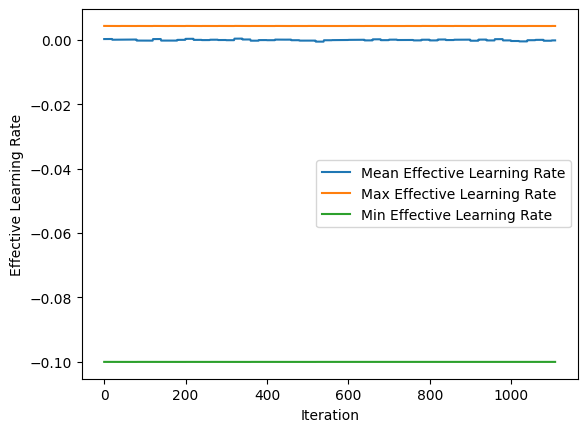

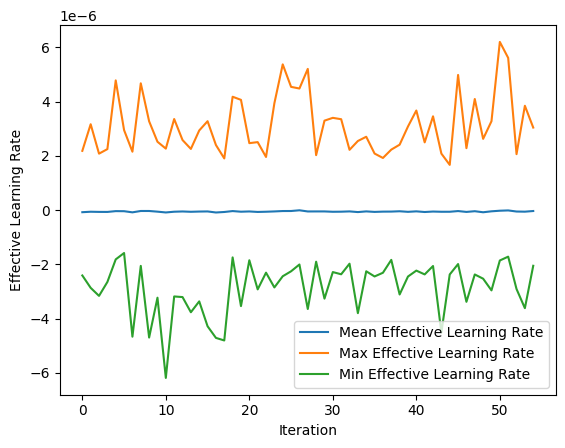

In [53]:
# Example: Plotting the effective learning rate
import matplotlib.pyplot as plt
plt.plot(model.pc_conv1.effective_learning["v_mean"], label='Mean Effective Learning Rate')
plt.plot(model.pc_conv1.effective_learning["v_max"], label='Max Effective Learning Rate')
plt.plot(model.pc_conv1.effective_learning["v_min"], label='Min Effective Learning Rate')
plt.xlabel('Iteration')
plt.ylabel('Effective Learning Rate')
plt.legend()
plt.show()


# Example: Plotting the effective learning rate
import matplotlib.pyplot as plt
plt.plot(model.pc_conv1.effective_learning["w_mean"], label='Mean Effective Learning Rate')
plt.plot(model.pc_conv1.effective_learning["w_max"], label='Max Effective Learning Rate')
plt.plot(model.pc_conv1.effective_learning["w_min"], label='Min Effective Learning Rate')
plt.xlabel('Iteration')
plt.ylabel('Effective Learning Rate')
plt.legend()
plt.show()

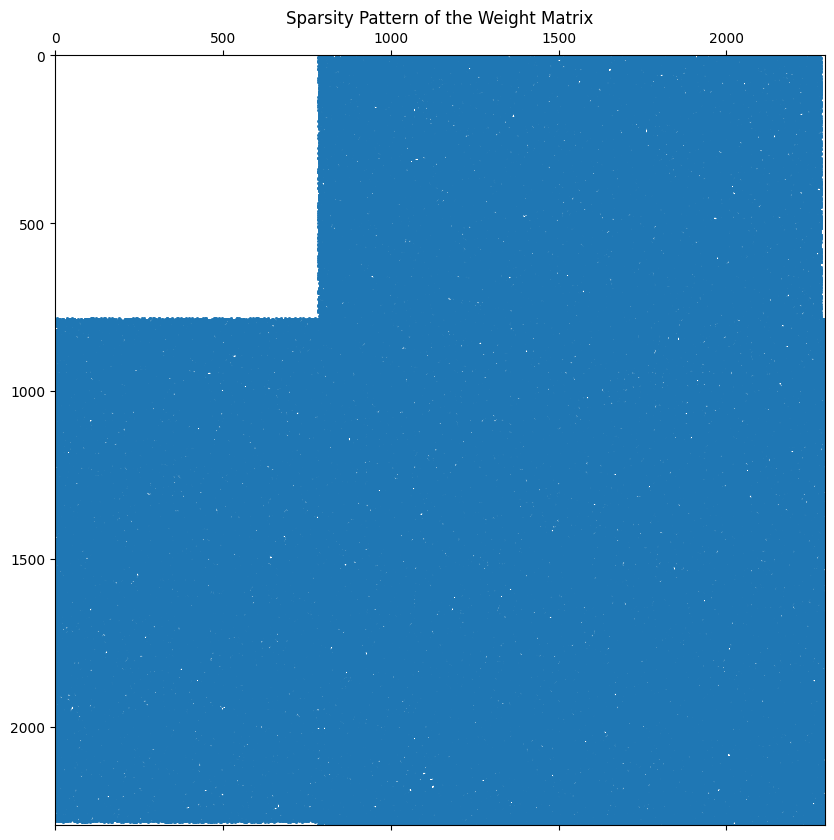

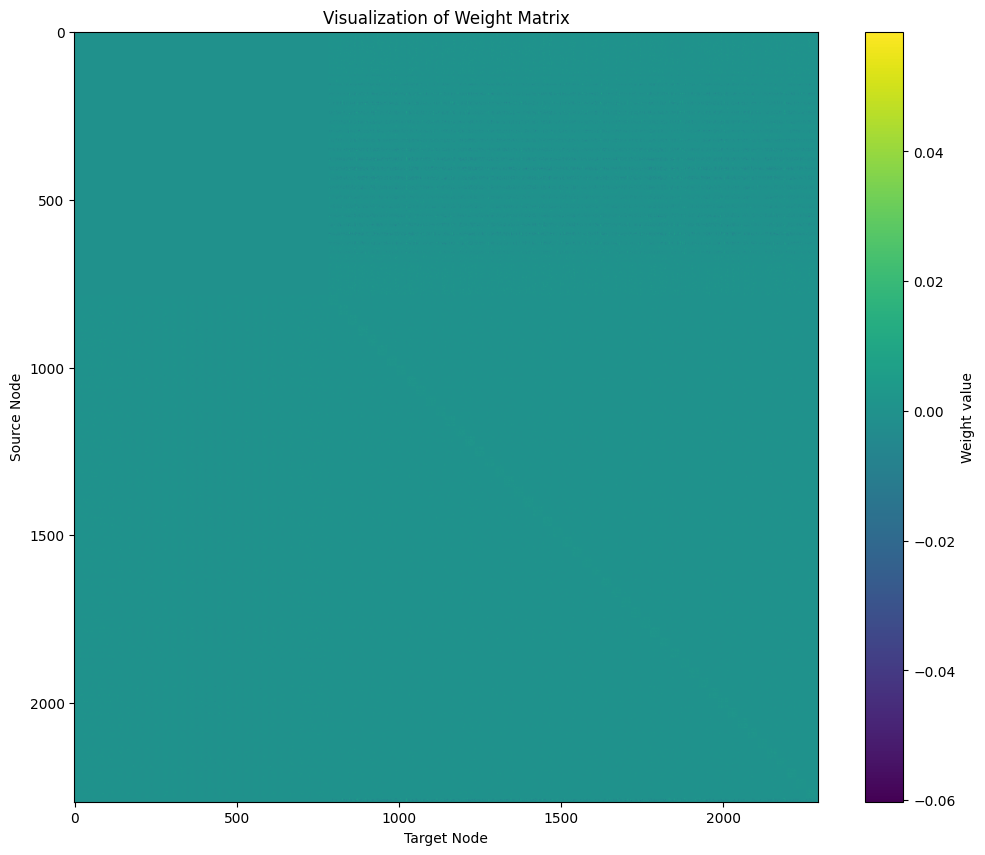

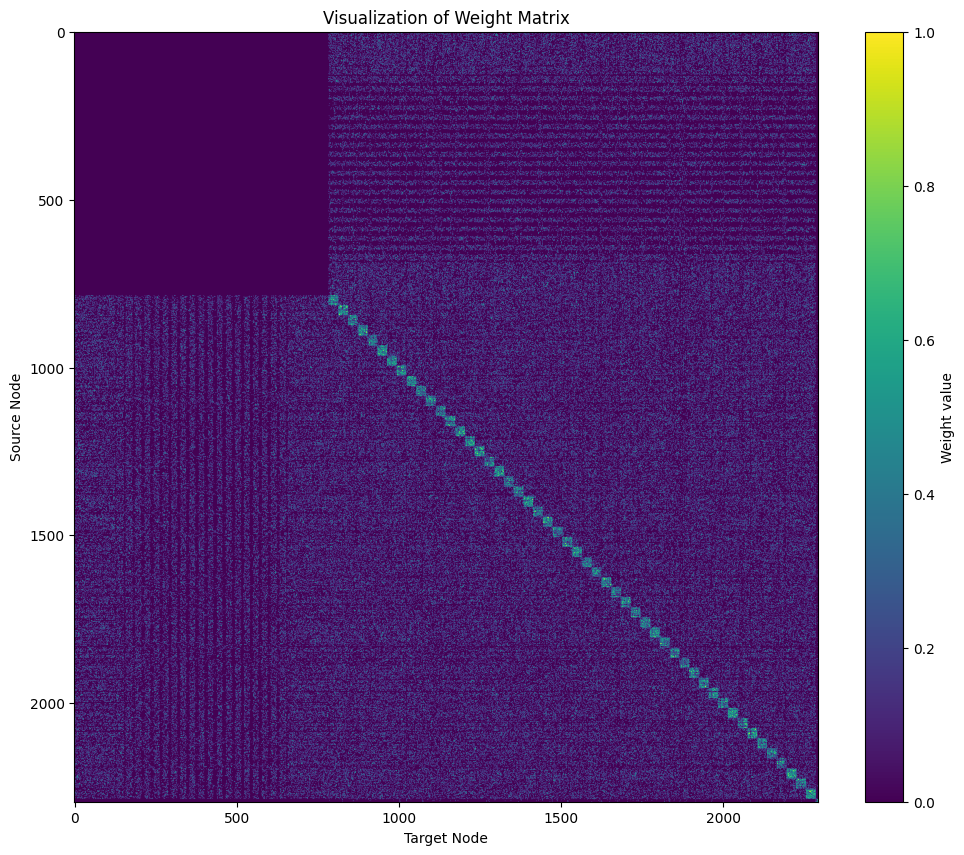

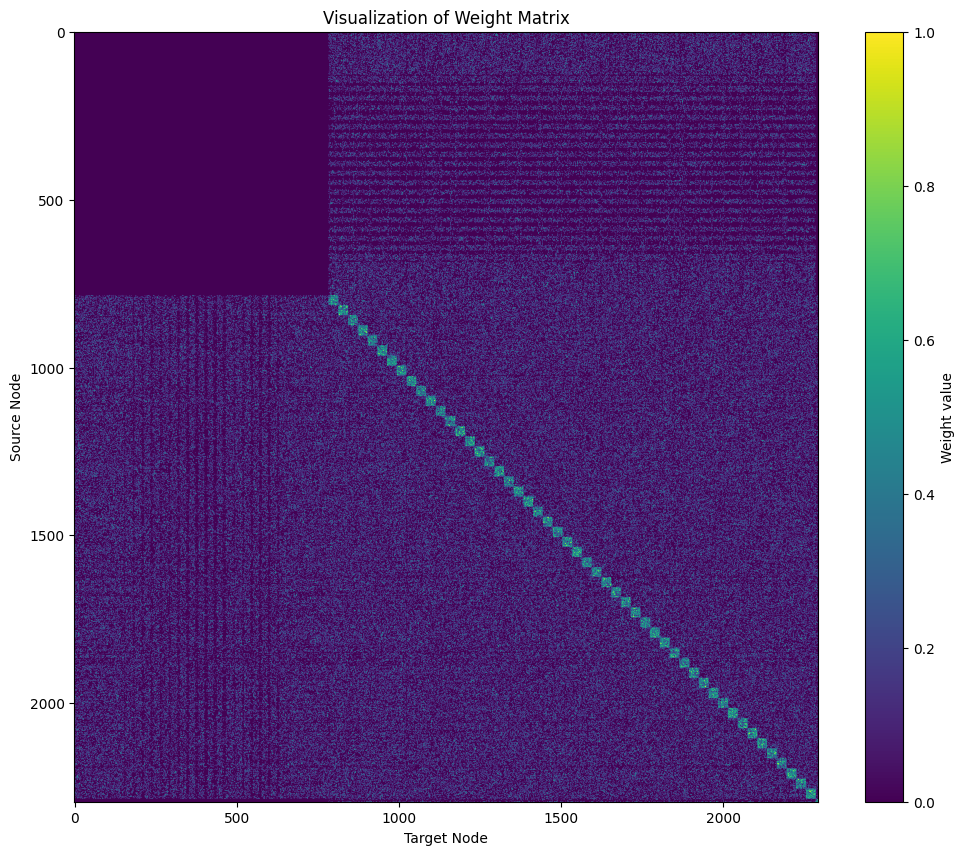

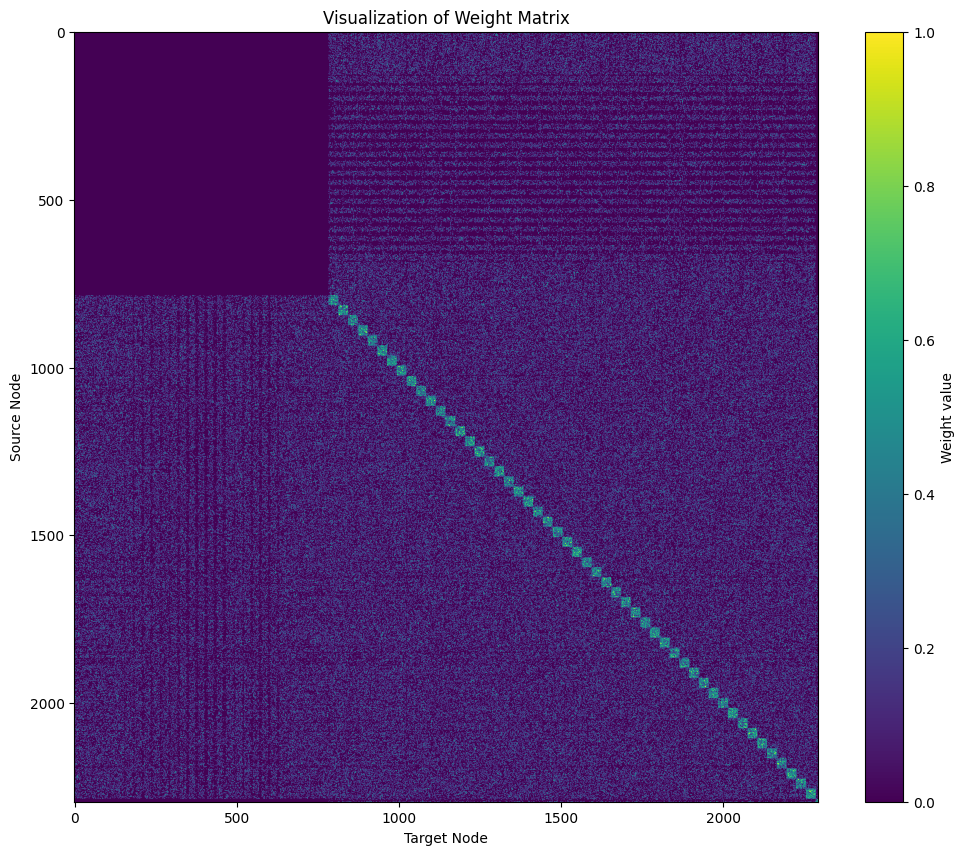

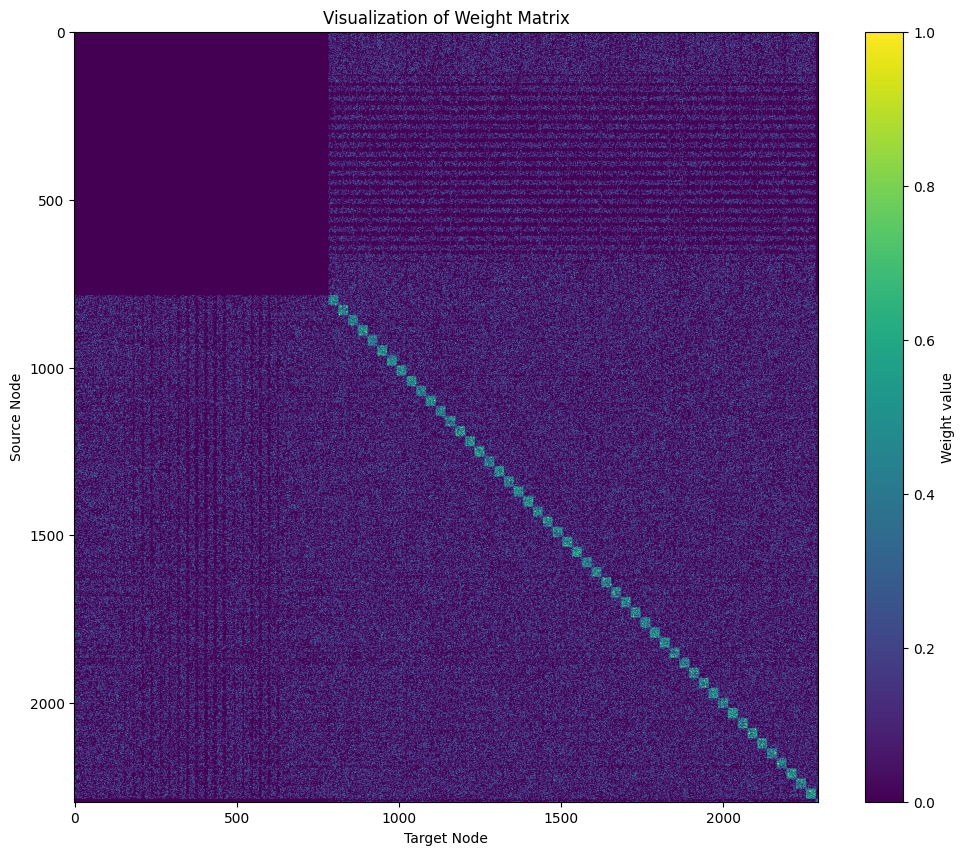

In [83]:
import matplotlib.pyplot as plt
import torch
import scipy.sparse as sp

# Assume num_vertices is defined, and model is an instance of your model class

# Extract the edge indices and weights
edge_index = model.pc_conv1.edge_index_single_graph.cpu().numpy()
weights = model.pc_conv1.weights.cpu().detach().numpy()

# Create a sparse matrix using the edge indices and weights
W_sparse = sp.coo_matrix((weights, (edge_index[0], edge_index[1])), shape=(num_vertices, num_vertices))

# Option 1: Quick visualization using `spy`
plt.figure(figsize=(10, 10))
plt.spy(W_sparse, markersize=1)
plt.title('Sparsity Pattern of the Weight Matrix')
plt.show()

# Option 2: Convert to dense for detailed visualization (if the graph is not too large)
W = W_sparse.toarray()
plt.figure(figsize=(12, 10))
plt.imshow(W, cmap='viridis', aspect='auto')
plt.colorbar(label='Weight value')
plt.title('Visualization of Weight Matrix')
plt.xlabel('Target Node')
plt.ylabel('Source Node')
plt.show()


# Option 2: Convert to dense for detailed visualization (if the graph is not too large)
plt.figure(figsize=(12, 10))
plt.imshow(W > 0.001, cmap='viridis', aspect='auto')
plt.colorbar(label='Weight value')
plt.title('Visualization of Weight Matrix')
plt.xlabel('Target Node')
plt.ylabel('Source Node')
plt.show()

# Option 2: Convert to dense for detailed visualization (if the graph is not too large)
plt.figure(figsize=(12, 10))
plt.imshow(W > 0.0001, cmap='viridis', aspect='auto')
plt.colorbar(label='Weight value')
plt.title('Visualization of Weight Matrix')
plt.xlabel('Target Node')
plt.ylabel('Source Node')
plt.show()

# Option 2: Convert to dense for detailed visualization (if the graph is not too large)
plt.figure(figsize=(12, 10))
plt.imshow(W > 0.00001, cmap='viridis', aspect='auto')
plt.colorbar(label='Weight value')
plt.title('Visualization of Weight Matrix')
plt.xlabel('Target Node')
plt.ylabel('Source Node')
plt.show()


# Option 2: Convert to dense for detailed visualization (if the graph is not too large)
plt.figure(figsize=(12, 10))
plt.imshow(W > 0.000001, cmap='viridis', aspect='auto')
plt.colorbar(label='Weight value')
plt.title('Visualization of Weight Matrix')
plt.xlabel('Target Node')
plt.ylabel('Source Node')
plt.show()


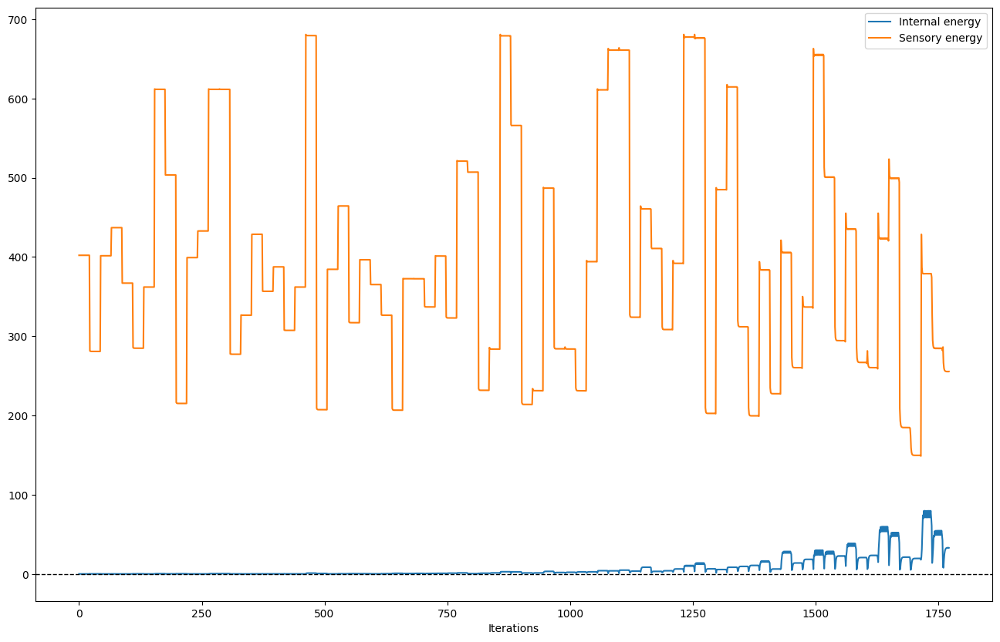

In [84]:
# scaled between 0 and 1

plt.figure(figsize=(16, 10))

a, b = model.pc_conv1.energy_vals["internal_energy"][:],  model.pc_conv1.energy_vals["sensory_energy"][:]
# a, b = model.pc_conv1.energy_vals["internal_energy"][:model.pc_conv1.T ],  model.pc_conv1.energy_vals["sensory_energy"][:]
plt.plot(a, label="Internal energy")
plt.plot(b, label="Sensory energy")

# for every self.t at vbar
# for i in range(1, num_epochs):
#     plt.vlines(x= ((model.pc_conv1.T+1)*i), ymin=0, ymax=np.max(a), colors='r', linestyles='dashed')
plt.axhline(0, color='black', lw=1, linestyle="--")
plt.xlabel("Iterations")
plt.legend()
plt.show()

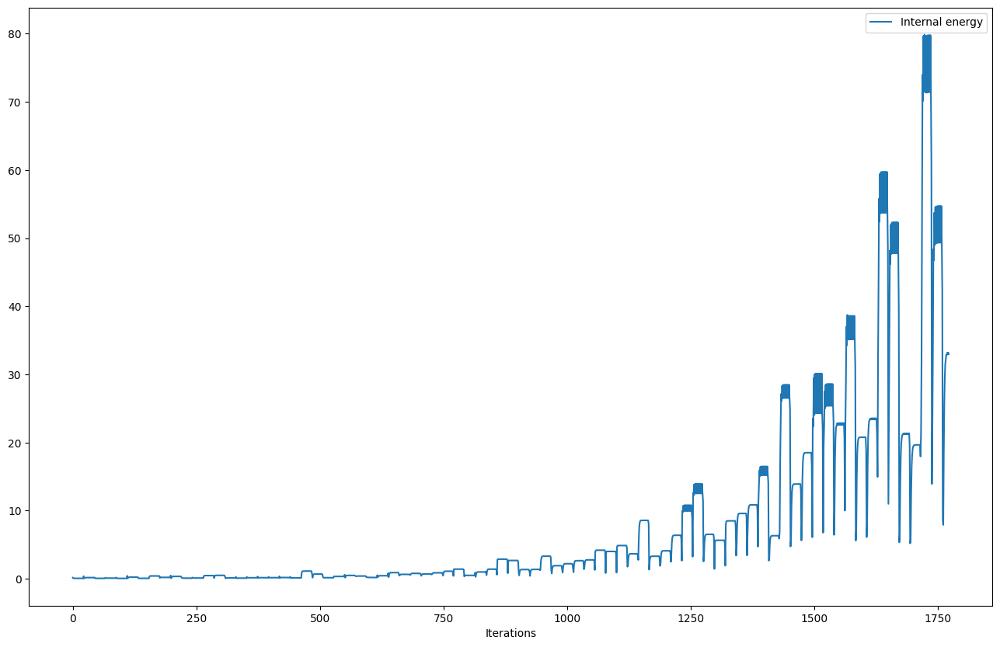

In [85]:
# scaled between 0 and 1
plt.figure(figsize=(16, 10))

a, b = model.pc_conv1.energy_vals["internal_energy"][:],  model.pc_conv1.energy_vals["sensory_energy"][:]
# a, b = model.pc_conv1.energy_vals["internal_esnergy"][:model.pc_conv1.T ],  model.pc_conv1.energy_vals["sensory_energy"][:]
plt.plot(a, label="Internal energy")
# plt.plot(b, label="Sensory energy")

# for every self.t at vbar
# for i in range(1, num_epochs):
#     plt.vlines(x= ((model.pc_conv1.T+1)*i), ymin=0, ymax=np.max(a), colors='r', linestyles='dashed')
plt.xlabel("Iterations")
plt.legend()
plt.show()

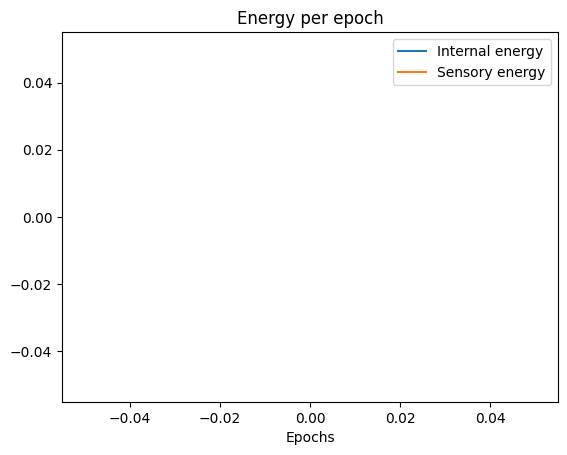

In [ ]:
plt.plot(history["internal_energy_per_epoch"], label="Internal energy")
plt.plot(history["sensory_energy_per_epoch"], label="Sensory energy")
plt.xlabel("Epochs")
plt.title("Energy per epoch")
plt.legend()

### Connection strength

<p>
Sens ---pred--> Label <br />
Sens <--error-- Label 
</p>


Sens --_error--> Label<br />
Sens <--pred---- Label 


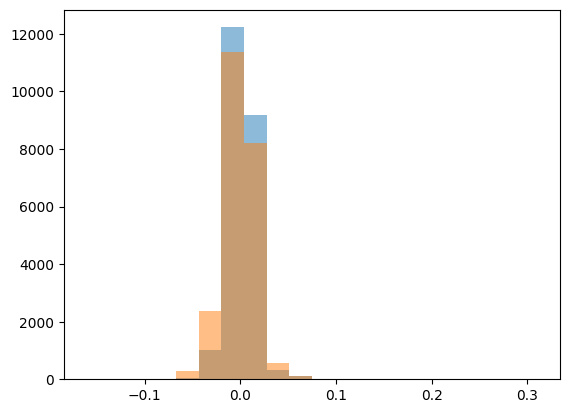

In [ ]:
incomming = W[-10:, ].flatten()
outgoing = W[:, -10:].flatten()
plt.hist(incomming, alpha=0.5, bins=20, label="")
plt.hist(outgoing, alpha=0.5, bins=20, label="")
plt.show()


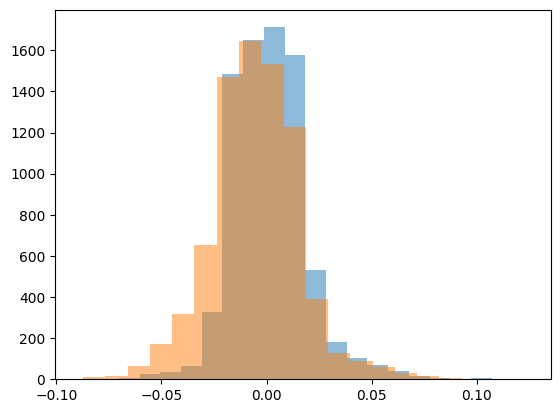

In [ ]:
incomming = W[-10:, 0:784 ].flatten()
outgoing = W[0:784 :, -10:].flatten()
plt.hist(incomming, alpha=0.5, bins=20)
plt.hist(outgoing, alpha=0.5, bins=20)
plt.show()


# Recon

In [86]:
# device = torch.device('cpu')

dataset_params_testing = dataset_params.copy()

if "batch_size" in dataset_params_testing.keys():
    # remove keys 
    del dataset_params_testing["batch_size"]

if "NUM_INTERNAL_NODES" in dataset_params_testing.keys():
    # remove keys 
    del dataset_params_testing["NUM_INTERNAL_NODES"]

dataset_params_testing["edge_index"] = custom_dataset_train.edge_index

dataset_params_testing["mnist_dataset"] = mnist_testset
dataset_params_testing["N"] = "all"

for key in dataset_params_testing:
    print(key, ":\t ", dataset_params_testing[key])

mnist_dataset :	  Dataset MNIST
    Number of datapoints: 10000
    Root location: data
    Split: Test
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=(0.1307,), std=(0.3081,))
           )
supervised_learning :	  True
numbers_list :	  [0, 1, 3, 4, 5, 6]
same_digit :	  False
add_noise :	  False
noise_intensity :	  0.0
include_self_connections :	  True
N :	  all
edge_index :	  tensor([[   0,    0,    0,  ..., 2293, 2293, 2293],
        [ 787,  809,  853,  ..., 2287, 2288, 2292]])


In [87]:
# CustomGraphDataset params
custom_dataset_test = CustomGraphDataset(graph_params, **dataset_params_testing)
# dataset_params_testing["batch_size"] = 2

test_loader = DataLoader(custom_dataset_test, batch_size=1, shuffle=True)

Supervised learning
Taking first n=all digits from each class


In [88]:
# device = torch.device('cpu')
from PYG.eval import classification, denoise, occlusion, generation #, reconstruction
model.pc_conv1.batchsize = 1

In [ ]:
model.pc_conv1.errors.shape

torch.Size([2294, 1])

In [ ]:
model.pc_conv1.internal_indices

range(784, 2284)

-------------mode testing--------------
-------------task reconstruction--------------
-------------Restarting activity (weights/pred/errors/values)--------------
Selected idx:  8539
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
idx 1
labels model tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Random init values of all internal nodes
----------------reconstruction-----------------
TASK IS reconstruction
Pass
Aaaa torch.Size([2294, 3, 1])


Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 3.022108 -0.62023914
Denoised val 2.8214867 -0.42421296
tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')


[0.6766]

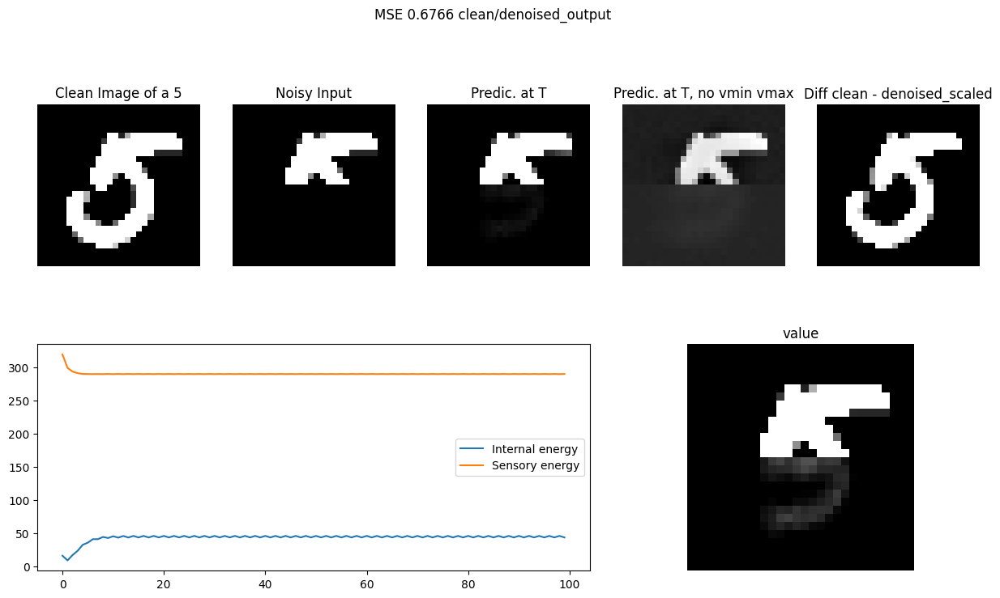

In [93]:
test_params = {
    "T": 100,
    "supervised_learning":True, 
    "num_samples": 1,
    "add_sens_noise": False,
}

# model.pc_conv1.lr_values = 0.1 
# model.pc_conv1.lr_values = model_params["lr_params"][0]

occlusion(test_loader, model, test_params)

# reconstruction(test_loader, model, test_params)
                            
# MSE_values = denoise(test_loader, model, supervised_learning=True)
# print("MSE_values", MSE_values)


In [ ]:
model.pc_conv1.sensory_indices

range(0, 784)

In [ ]:
model.pc_conv1.nodes_2_update

[392,
 393,
 394,
 395,
 396,
 397,
 398,
 399,
 400,
 401,
 402,
 403,
 404,
 405,
 406,
 407,
 408,
 409,
 410,
 411,
 412,
 413,
 414,
 415,
 416,
 417,
 418,
 419,
 420,
 421,
 422,
 423,
 424,
 425,
 426,
 427,
 428,
 429,
 430,
 431,
 432,
 433,
 434,
 435,
 436,
 437,
 438,
 439,
 440,
 441,
 442,
 443,
 444,
 445,
 446,
 447,
 448,
 449,
 450,
 451,
 452,
 453,
 454,
 455,
 456,
 457,
 458,
 459,
 460,
 461,
 462,
 463,
 464,
 465,
 466,
 467,
 468,
 469,
 470,
 471,
 472,
 473,
 474,
 475,
 476,
 477,
 478,
 479,
 480,
 481,
 482,
 483,
 484,
 485,
 486,
 487,
 488,
 489,
 490,
 491,
 492,
 493,
 494,
 495,
 496,
 497,
 498,
 499,
 500,
 501,
 502,
 503,
 504,
 505,
 506,
 507,
 508,
 509,
 510,
 511,
 512,
 513,
 514,
 515,
 516,
 517,
 518,
 519,
 520,
 521,
 522,
 523,
 524,
 525,
 526,
 527,
 528,
 529,
 530,
 531,
 532,
 533,
 534,
 535,
 536,
 537,
 538,
 539,
 540,
 541,
 542,
 543,
 544,
 545,
 546,
 547,
 548,
 549,
 550,
 551,
 552,
 553,
 554,
 555,
 556,
 557,
 558

-------------mode testing--------------
-------------task classification--------------
model.pc_conv1.values.shape torch.Size([2294, 1])
AAAAAAAAAAAA
model.pc_conv1.values.shape torch.Size([2294, 1])
No vmin vmax
Selected idx:  834
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
tensor([6])
torch.Size([2294, 3, 1])
labels model tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
CHECK tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Random init values of all internal nodes
----------------reconstruction-----------------
TASK IS classification
Pass
Aaaa torch.Size([2294, 3, 1])


Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 2.9048522 -0.6616343
Denoised val 2.8214867 -0.42421296
tensor([-0.0771, -0.0089, -0.1135,  0.0484,  0.0130, -0.0151,  0.0443, -0.1053,
        -0.1049, -0.1140], device='cuda:0')
tensor([-0.0771, -0.0089, -0.1135,  0.0484,  0.0130, -0.0151,  0.0443, -0.1053,
        -0.1049, -0.1140], device='cuda:0')
tensor([[-0.0771],
        [-0.0089],
        [-0.1135],
        [ 0.0484],
        [ 0.0130],
        [-0.0151],
        [ 0.0443],
        [-0.1053],
        [-0.1049],
        [-0.1140]], device='cuda:0')
tensor([0.0965, 0.1033, 0.0930, 0.1094, 0.1056, 0.1027, 0.1089, 0.0938, 0.0938,
        0.0930], device='cuda:0')
tensor(3)
Selected idx:  6479
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
tensor([6])
torch.Size([2294, 3, 1])
labels model tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0

Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 3.029807 -0.5766027
Denoised val 2.8214867 -0.42421296
tensor([-0.0826, -0.0073, -0.1155,  0.0537,  0.0199, -0.0156,  0.0441, -0.1049,
        -0.0947, -0.1211], device='cuda:0')
tensor([-0.0826, -0.0073, -0.1155,  0.0537,  0.0199, -0.0156,  0.0441, -0.1049,
        -0.0947, -0.1211], device='cuda:0')
tensor([[-0.0826],
        [-0.0073],
        [-0.1155],
        [ 0.0537],
        [ 0.0199],
        [-0.0156],
        [ 0.0441],
        [-0.1049],
        [-0.0947],
        [-0.1211]], device='cuda:0')
tensor([0.0959, 0.1033, 0.0928, 0.1099, 0.1062, 0.1025, 0.1088, 0.0937, 0.0947,
        0.0922], device='cuda:0')
tensor(3)
Selected idx:  2170
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
tensor([6])
torch.Size([2294, 3, 1])
labels model tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.

Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 2.9939623 -0.5758047
Denoised val 2.8214867 -0.42421296
tensor([-0.0389, -0.0012, -0.0698,  0.0439,  0.0195, -0.0042,  0.0435, -0.0648,
        -0.0614, -0.0722], device='cuda:0')
tensor([-0.0389, -0.0012, -0.0698,  0.0439,  0.0195, -0.0042,  0.0435, -0.0648,
        -0.0614, -0.0722], device='cuda:0')
tensor([[-0.0389],
        [-0.0012],
        [-0.0698],
        [ 0.0439],
        [ 0.0195],
        [-0.0042],
        [ 0.0435],
        [-0.0648],
        [-0.0614],
        [-0.0722]], device='cuda:0')
tensor([0.0981, 0.1019, 0.0951, 0.1066, 0.1040, 0.1015, 0.1065, 0.0956, 0.0959,
        0.0949], device='cuda:0')
tensor(3)
Selected idx:  524
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
tensor([3])
torch.Size([2294, 3, 1])
labels model tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.

Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 2.9615667 -0.5463766
Denoised val 2.8214867 -0.42421296
tensor([-0.0346, -0.0032, -0.0616,  0.0272,  0.0111, -0.0038,  0.0333, -0.0559,
        -0.0546, -0.0641], device='cuda:0')
tensor([-0.0346, -0.0032, -0.0616,  0.0272,  0.0111, -0.0038,  0.0333, -0.0559,
        -0.0546, -0.0641], device='cuda:0')
tensor([[-0.0346],
        [-0.0032],
        [-0.0616],
        [ 0.0272],
        [ 0.0111],
        [-0.0038],
        [ 0.0333],
        [-0.0559],
        [-0.0546],
        [-0.0641]], device='cuda:0')
tensor([0.0985, 0.1017, 0.0959, 0.1048, 0.1032, 0.1016, 0.1055, 0.0965, 0.0966,
        0.0957], device='cuda:0')
tensor(6)
---------Done-----------------
TODO output y_pred and y_true to file 
[6, 6, 6, 3] [3, 3, 3, 6]
Classification Metrics:
Accuracy: 0.00
Precision: 0.00
Recall: 0.00
F1 Score: 0.00


0.0

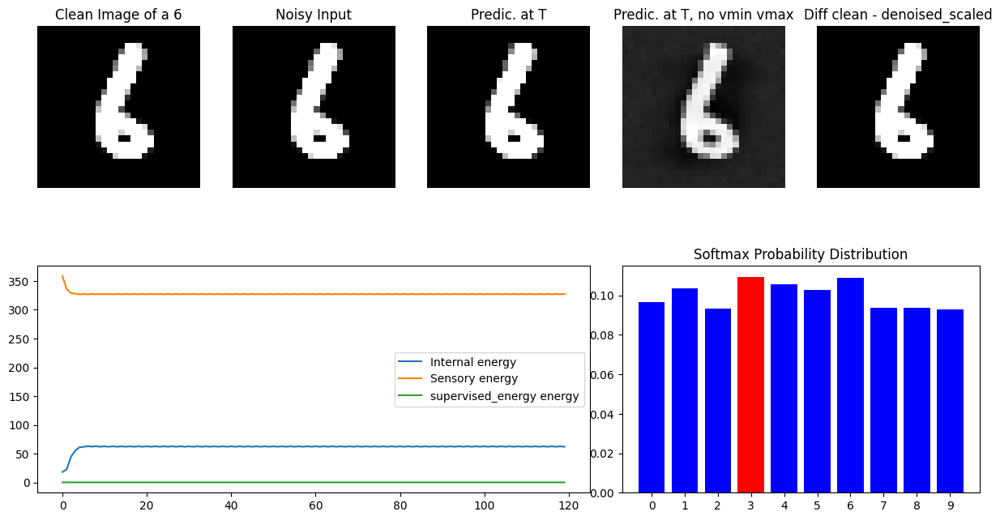

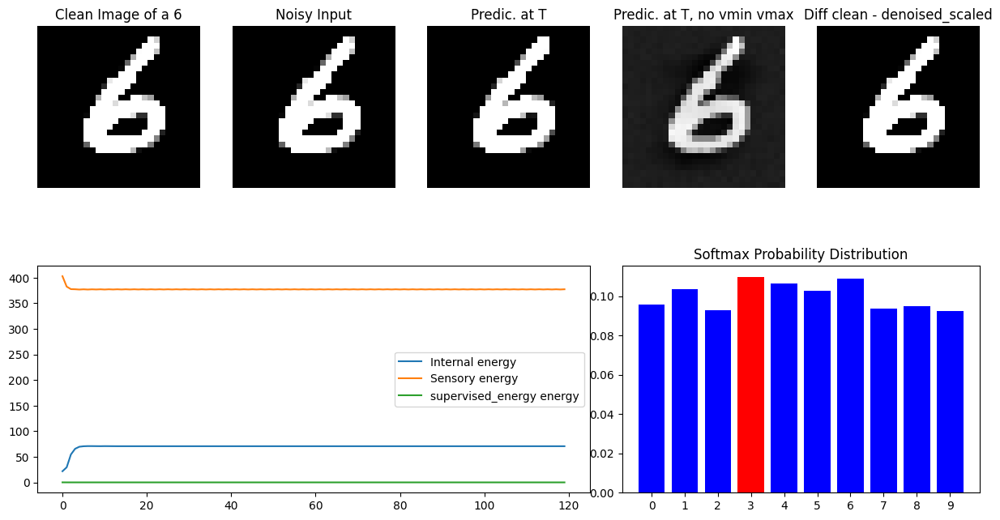

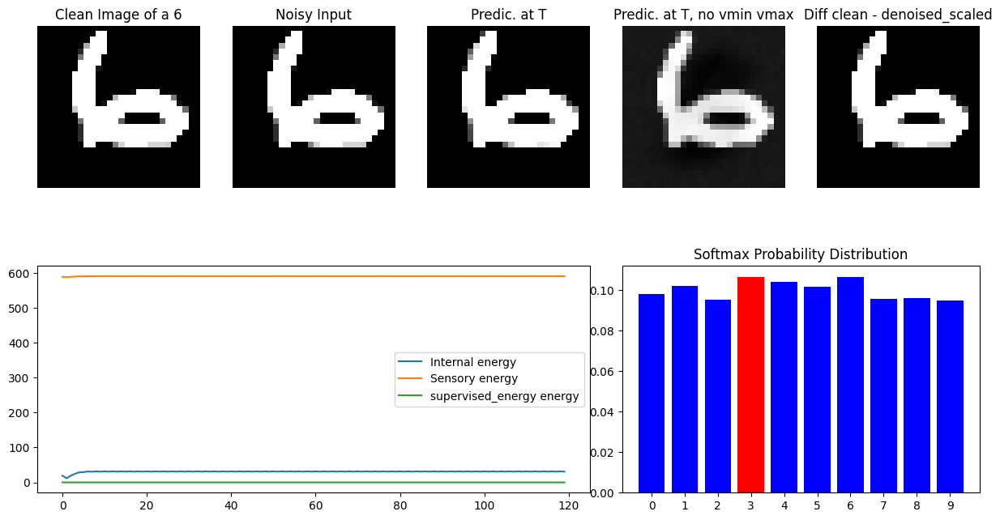

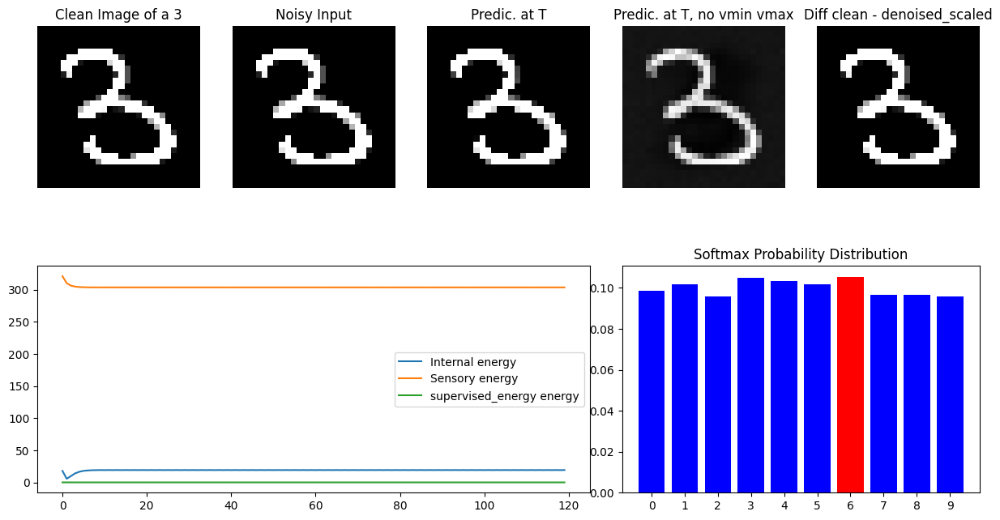

In [94]:
test_params = {
    "T":120,
    "supervised_learning":False, 
    "num_samples": 4,
}

# model.pc_conv1.lr_values = 0.1
# model.pc_conv1.lr_values = model_params["lr_params"][0]

classification(test_loader, model, test_params)

-------------mode testing--------------
-------------task reconstruction--------------
-------------Restarting activity (weights/pred/errors/values)--------------
-------------mode testing--------------
-------------task reconstruction--------------
Selected idx:  5391
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
labels model tensor([[ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [10.],
        [ 0.],
        [ 0.],
        [ 0.]], device='cuda:0')
Random init values of all internal nodes
----------------reconstruction-----------------
TASK IS reconstruction
Pass
Aaaa torch.Size([2294, 3, 1])


Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 0.031398557 -0.03947027
Denoised val 0.08792915 -0.1125098
tensor([[ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [10.],
        [ 0.],
        [ 0.],
        [ 0.]], device='cuda:0')


[0.8696]

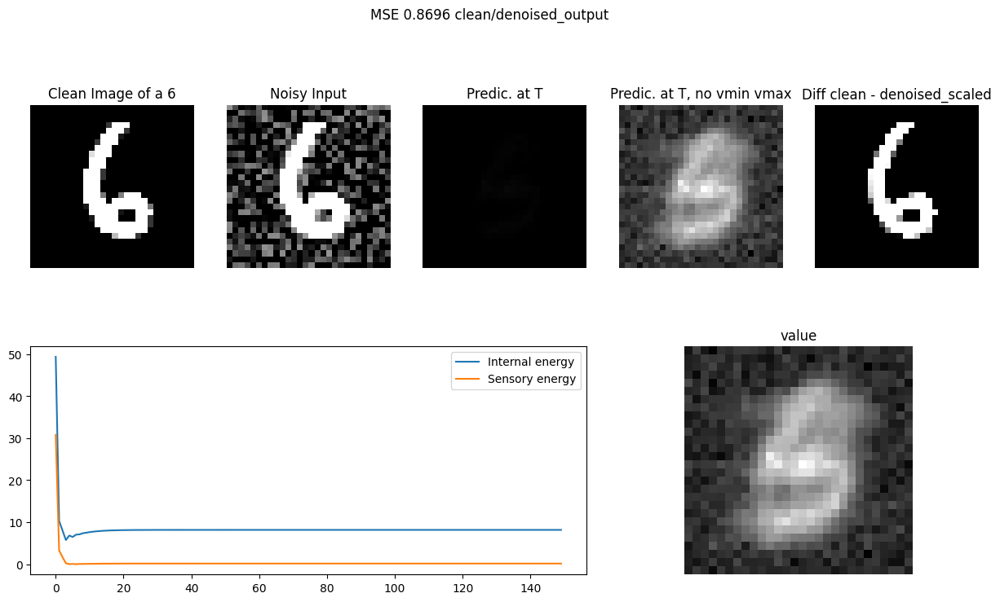

In [95]:
test_params = {
    "T": 150,
    "supervised_learning":True, 
    "num_samples": 1,
}

# model.pc_conv1.lr_values = 0.1
# model.pc_conv1.lr_values = model_params["lr_params"][0]

denoise(test_loader, model, test_params)
                            
# MSE_values = denoise(test_loader, model, supervised_learning=True)
# print("MSE_values", MSE_values)


-------------modetesting--------------
-------------taskreconstruction--------------
-------------Restarting activity (weights/pred/errors/values)--------------
-------------modetesting--------------
-------------taskreconstruction--------------
No vmin vmax
Selected idx:  34
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
tensor([0])
X shape torch.Size([5294, 3, 1])
labels model tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Random init values of all internal nodes
----------------reconstruction-----------------
TASK IS reconstruction
Pass
Aaaa torch.Size([5294, 3, 1])


Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 7.7552926e-05 -1.5011281e-05
Denoised val 7.766082e-05 -1.5180666e-05
tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Selected idx:  118
adding label 0 tensor([10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])
tensor([0])
X shape torch.Size([5294, 3, 1])
labels model tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Random init values of all internal nodes
----------------reconstruction-----------------
TASK IS reconstruction
Pass
Aaaa torch.Size([5294, 3, 1])


Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 7.679115e-05 -1.4736342e-05
Denoised val 7.688155e-05 -1.4904092e-05
tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')


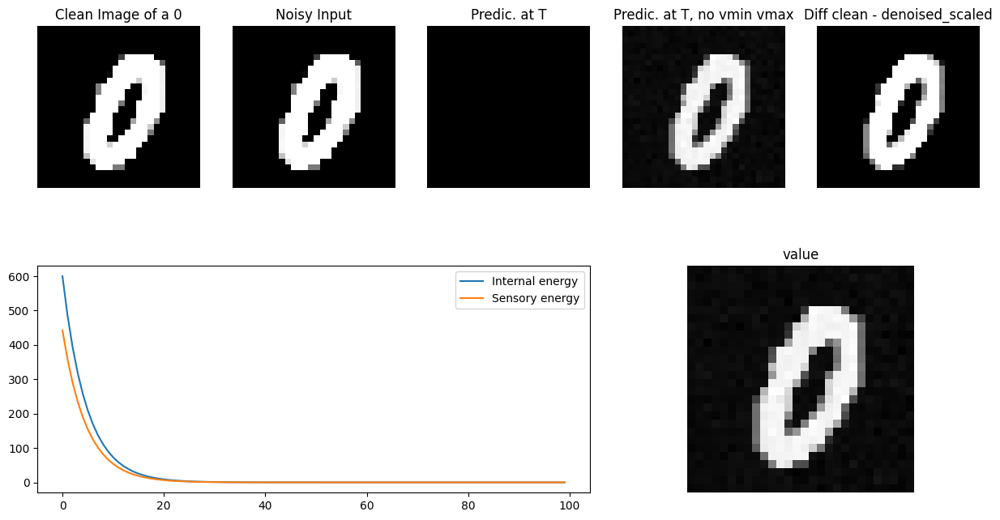

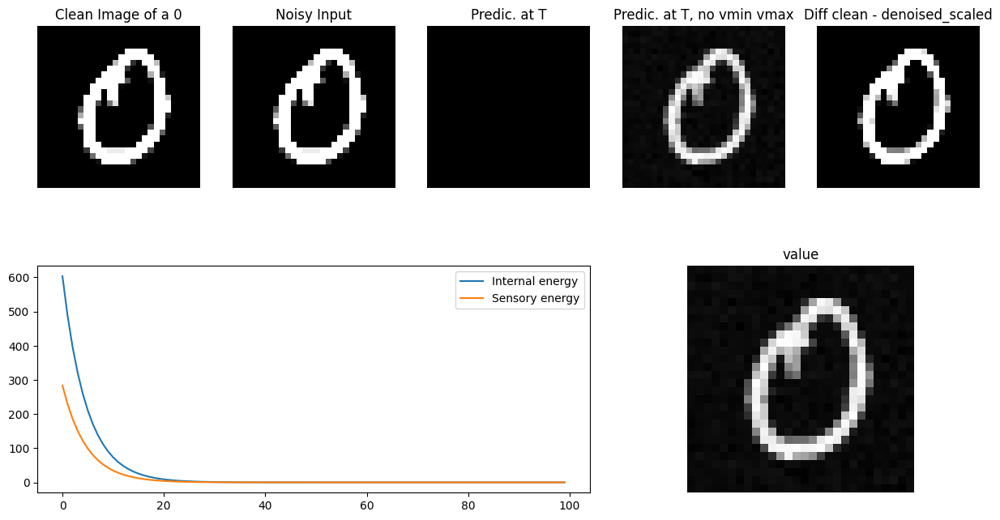

In [ ]:
test_params = {
    "T": 100,
    "supervised_learning":False, 
    "num_samples": 1,
}

# model.pc_conv1.lr_values = 0.1
# model.pc_conv1.lr_values = model_params["lr_params"][0]

# reconstruction(test_loader, model, test_params)
                            
# MSE_values = denoise(test_loader, model, supervised_learning=True)
# print("MSE_values", MSE_values)


-------------mode testing--------------
-------------task generation--------------
model.pc_conv1.values.shape torch.Size([2294, 1])
-------------Restarting activity (weights/pred/errors/values)--------------
No vmin vmax
Selected idx:  3671
adding label 6 tensor([ 0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.])
tensor([6])
torch.Size([2294, 3, 1])
omitting setting sensory nodes
labels before torch.Size([10]) tensor([0.0000, 0.0000, 0.2969, 0.0000, 0.0000, 0.1545, 0.0000, 0.0000, 0.7474,
        0.0000], device='cuda:0')
labels after tensor([0.0000, 0.0000, 0.2969, 0.0000, 0.0000, 0.1545, 0.0000, 0.0000, 0.7474,
        0.0000], device='cuda:0')
tensor([[ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [10.],
        [ 0.],
        [ 0.],
        [ 0.]], device='cuda:0')
labels model tensor([[ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [10.],
        [ 0.],
        [ 0.],
        [ 0.]], device='cuda

Inference completed.
QUery by condition or query by init
CHECK tensor([[ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [10.],
        [ 0.],
        [ 0.],
        [ 0.]], device='cuda:0')
Predic. at T, no vmin vmax 0.031398546 -0.03947027
Denoised val 0.087929145 -0.1125098
generation_task_6.png
CHECK tensor([[ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [10.],
        [ 0.],
        [ 0.],
        [ 0.]], device='cuda:0')


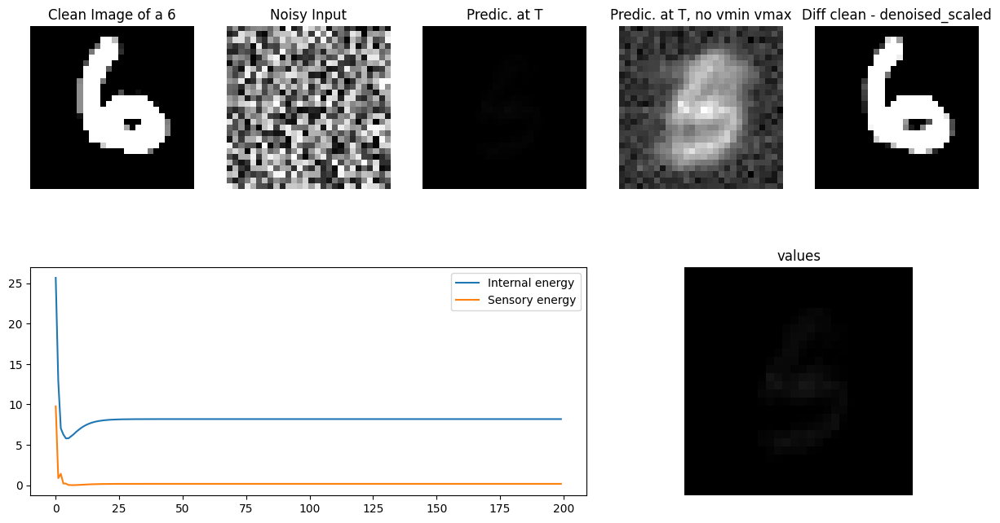

In [97]:
test_params = {
    "T": 200,
    "supervised_learning":True, 
    "num_samples": 1,
}

# model.pc_conv1.lr_values = 0.1
# model.pc_conv1.lr_values = model_params["lr_params"][0]

generation(test_loader, model, test_params)
                            
# MSE_values = denoise(test_loader, model, supervised_learning=True)
# print("MSE_values", MSE_values)


-------------modetesting--------------
-------------taskreconstruction--------------
model.pc_conv1.values.shape torch.Size([2294, 1])
-------------Restarting activity (weights/pred/errors/values)--------------
-------------modetesting--------------
-------------taskreconstruction--------------
model.pc_conv1.values.shape torch.Size([2294, 1])
No vmin vmax
Selected idx:  191
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
tensor([5])
-------------Restarting activity (weights/pred/errors/values)--------------
X shape torch.Size([2294, 3, 1])
labels dataloader tensor([ 0.0000,  0.0000, -0.4242,  0.0000,  0.0000, -0.4242,  0.0000,  0.0000,
        -0.4242,  0.0000], device='cuda:0')
torch.Size([10, 1]) torch.Size([10, 1])
labels model tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Random init values of all internal nodes
----------------reconstruction---

Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 0.066072 -0.002657618
Denoised val 0.09777967 -0.0032230427
tensor([[ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [10.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.]], device='cuda:0')


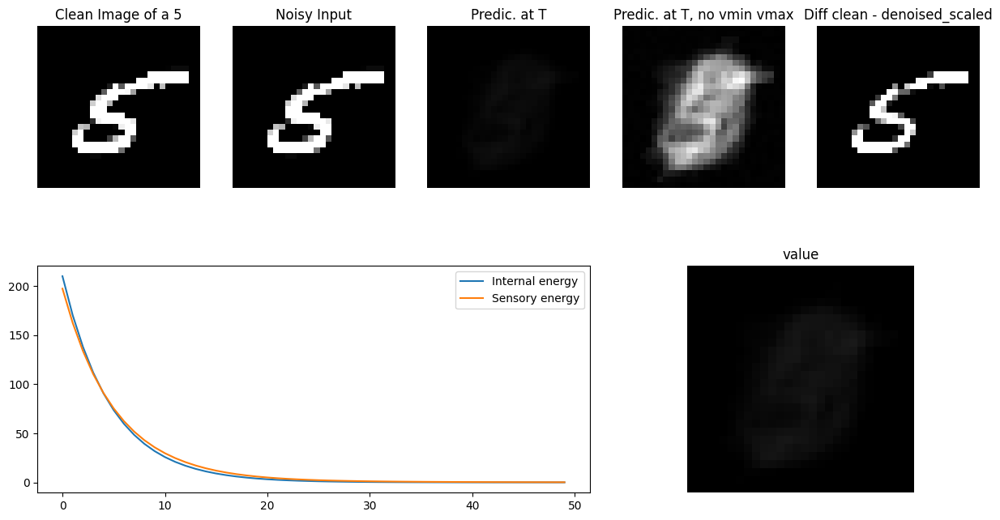

In [ ]:
model.pc_conv1.debug = False
model.pc_conv1.T = 100
# model.pc_conv1.lr_gamma = 10
# model.pc_conv1.lr_alpha = 10

model.pc_conv1.set_mode("testing", task="reconstruction")


# model.pc_conv1.nodes_2_update +=  list(model.pc_conv1.supervised_labels)

model.pc_conv1.batchsize = 1

print("model.pc_conv1.values.shape", model.pc_conv1.values.shape)
model.pc_conv1.restart_activity()


batch_idx = 0.


model.pc_conv1.debug = False
model.pc_conv1.T = 50
model.pc_conv1.set_mode("testing", task="reconstruction")
model.pc_conv1.batchsize = 1

print("model.pc_conv1.values.shape", model.pc_conv1.values.shape)

batch_idx = 0

print("No vmin vmax")
for idx, (noisy_batch, clean_image) in enumerate(test_loader):

    # noisy_batch, clean_image = noisy_batch[0], clean_image[0]
    print(noisy_batch.y)

    model.pc_conv1.restart_activity()

    # Perform inference to denoise
    noisy_batch = noisy_batch.to(device)

    # TEST: set x of noisy_batch to equal all zeros
    # noisy_batch.x += torch.rand(noisy_batch.x.shape).to(device)
    print("X shape", noisy_batch.x.shape)

    # set bottom half of the image to zero
    # print("Make occuled")

    noisy_batch.x[:, 0][model.pc_conv1.internal_indices] = torch.rand(noisy_batch.x[:, 0][model.pc_conv1.internal_indices].shape).to(model.pc_conv1.device)


    # model.pc_conv1.set_sensory_nodes(noisy_batch.x)

    #### SURVERVISED ##########

    if dataset_params["supervised_learning"]:
        print("labels dataloader", noisy_batch.x.view(-1)[model.pc_conv1.supervised_labels])
        one_hot = torch.zeros(10, device=device)
        one_hot[noisy_batch.y] = 1 
        
        one_hot[noisy_batch.y] = 0 

        one_hot = one_hot.view(-1, 1)
        print(model.pc_conv1.values.data[supervised_labels].shape,  one_hot.shape)
        model.pc_conv1.values.data[supervised_labels] = one_hot

        # for i in model.pc_conv1.supervised_labels: 
        #     model.pc_conv1.values.data[i] = noisy_batch.x.view(-1)[i]
        
        # model.pc_conv1.values[model.pc_conv1.supervised_labels].data = noisy_batch.x[model.pc_conv1.supervised_labels]
        
        print("labels model", model.pc_conv1.values[model.pc_conv1.supervised_labels])
    
    # model.inference()
    
    # remove label
    # noisy_batch.x[:, 0][-10:] = 0

    # noisy_batch.x[:, 0][0:784] += 1.5 * torch.rand(noisy_batch.x[:, 0][0:784].shape).to(device)

    # Extract the denoised output from the sensory nodes
    noisy_image = noisy_batch.x[:, 0][0:784].view(28,28).cpu().detach().numpy()
    
    
    values, predictions, labels = model.query(method="pass", data=noisy_batch)  # query_by_conditioning
    # values, predictions = values[batch_idx, :, 0], predictions[batch_idx, :, 0]
    
    denoised_output = predictions[0:784].view(28,28).cpu().detach().numpy()

    # denoised_output = model.reconstruction().view(28,28).cpu().detach().numpy()

    clean_image = clean_image.view(28,28).cpu().numpy()  # Adjust shape as necessary

    # all cmaps starting with Red, blue with
    # maps = RdBu, RdBu_r, RdBu_r, RdBu, BrBG, BrBG_r, coolwarm, coolwarm_r, bwr, bwr_r, seismic, seismic_r
    # cmap = "RdBu_r"
    cmap = "gray"
    
    # Creating a subplot mosaic
    fig, ax = plt.subplot_mosaic([
        ["A", "B", "C", "D", "E"],
        ["F", "F", "F", "G", "G"]
    ], figsize=(15, 8))

    # Plotting the images
    ax["A"].imshow(clean_image, vmin=0, vmax=1, cmap=cmap)
    ax["A"].set_title(f"Clean Image of a {noisy_batch.y.item()}")

    ax["B"].imshow(noisy_image, vmin=0, vmax=1, cmap=cmap)
    ax["B"].set_title("Noisy Input")

    ax["C"].imshow(denoised_output, vmin=0, vmax=1, cmap=cmap)
    ax["C"].set_title("Predic. at T")

    ax["D"].imshow(denoised_output, cmap=cmap)
    ax["D"].set_title("Predic. at T, no vmin vmax")
    print("Predic. at T, no vmin vmax", max(denoised_output.flatten()), min(denoised_output.flatten()))

    denoised_output_scaled = (denoised_output - min(denoised_output.flatten())) / (max(denoised_output.flatten()) - min(denoised_output.flatten()))
    ax["E"].imshow(clean_image - denoised_output_scaled, vmin=0, vmax=1, cmap=cmap)
    ax["E"].set_title("Diff clean - denoised_scaled")
    print("Denoised val", max(values[0:784].view(28, 28).cpu().detach().numpy().flatten()), min(values[0:784].view(28, 28).cpu().detach().numpy().flatten()))

    for a in ["A", "B", "C", "D", "E", "G"]:
        ax[a].axis('off')

    # Plotting the line graphs
    ax["F"].plot(model.pc_conv1.energy_vals["internal_energy"][-model.pc_conv1.T:], label="Internal energy")
    ax["F"].plot(model.pc_conv1.energy_vals["sensory_energy"][-model.pc_conv1.T:], label="Sensory energy")  # Replace with actual values
    ax["F"].legend()


    ax["G"].imshow(values[0:784].view(28,28).cpu().detach().numpy(), vmin=0, vmax=1, cmap=cmap)
    ax["G"].set_title("value")


    # fig.savefig(f'{model_dir}/reconstruction/recon_T_{model.pc_conv1.T}_{noisy_batch.y.item()}.png')

    labels = values[model.pc_conv1.supervised_labels]
    print(labels)

    difference_image = clean_image - denoised_output_scaled

    break


-------------modetesting--------------
-------------taskreconstruction--------------
model.pc_conv1.values.shape torch.Size([2294, 1])
-------------Restarting activity (weights/pred/errors/values)--------------
-------------modetesting--------------
-------------taskreconstruction--------------
model.pc_conv1.values.shape torch.Size([2294, 1])
No vmin vmax
Selected idx:  22
adding label 9 tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 10.])
tensor([9])
-------------Restarting activity (weights/pred/errors/values)--------------
X shape torch.Size([2294, 3, 1])
labels dataloader tensor([ 0.0000,  0.0000, -0.4242,  0.0000,  0.0000, -0.4242,  0.0000,  0.0000,
        -0.4242,  0.0000], device='cuda:0')
torch.Size([10, 1]) torch.Size([10, 1])
labels model tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
labels model tensor([[0.],
        [0.],
        [0.],
        [0.],
      

Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 0.01667607 -0.00012426467
Denoised val 0.026832707 -0.00035715319
tensor([[ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [10.]], device='cuda:0')


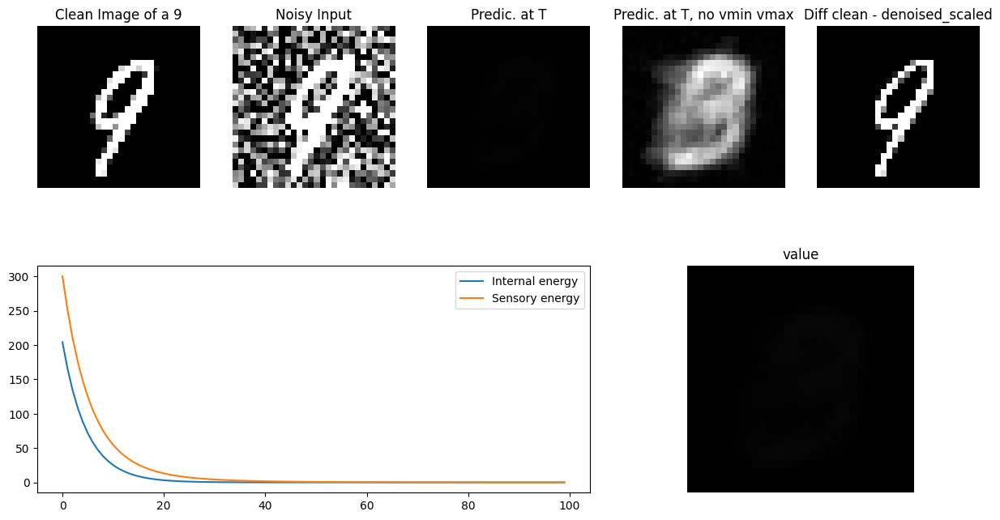

In [ ]:
model.pc_conv1.debug = False
model.pc_conv1.T = 100
# model.pc_conv1.lr_gamma = 10
# model.pc_conv1.lr_alpha = 10
model.pc_conv1.set_mode("testing", task="reconstruction")
# model.pc_conv1.nodes_2_update +=  list(model.pc_conv1.supervised_labels)

model.pc_conv1.batchsize = 1

print("model.pc_conv1.values.shape", model.pc_conv1.values.shape)
model.pc_conv1.restart_activity()

batch_idx = 0.

model.pc_conv1.debug = False
model.pc_conv1.T = 100
model.pc_conv1.set_mode("testing", task="reconstruction")
model.pc_conv1.batchsize = 1

print("model.pc_conv1.values.shape", model.pc_conv1.values.shape)

batch_idx = 0

print("No vmin vmax")
for idx, (noisy_batch, clean_image) in enumerate(test_loader):

    # noisy_batch, clean_image = noisy_batch[0], clean_image[0]
    print(noisy_batch.y)

    model.pc_conv1.restart_activity()

    # Perform inference to denoise
    noisy_batch = noisy_batch.to(device)

    # TEST: set x of noisy_batch to equal all zeros
    # noisy_batch.x += torch.rand(noisy_batch.x.shape).to(device)
    print("X shape", noisy_batch.x.shape)

    # set bottom half of the image to zero
    # print("Make occuled")

    # model.pc_conv1.set_sensory_nodes(noisy_batch.x)

    noisy_batch.x[:, 0][model.pc_conv1.internal_indices] = torch.rand(noisy_batch.x[:, 0][model.pc_conv1.internal_indices].shape).to(model.pc_conv1.device)


    #### SURVERVISED ##########

    if dataset_params["supervised_learning"]:
        print("labels dataloader", noisy_batch.x.view(-1)[model.pc_conv1.supervised_labels])
        one_hot = torch.zeros(10, device=device)
        # one_hot[noisy_batch.y] = 1 
        
        one_hot[noisy_batch.y] = 0 

        one_hot = one_hot.view(-1, 1)
        print(model.pc_conv1.values.data[supervised_labels].shape,  one_hot.shape)
        model.pc_conv1.values.data[supervised_labels] = one_hot

        # for i in model.pc_conv1.supervised_labels: 
        #     model.pc_conv1.values.data[i] = noisy_batch.x.view(-1)[i]
        
        # model.pc_conv1.values[model.pc_conv1.supervised_labels].data = noisy_batch.x[model.pc_conv1.supervised_labels]
        
        print("labels model", model.pc_conv1.values.data[model.pc_conv1.supervised_labels])
        print("labels model", model.pc_conv1.values[model.pc_conv1.supervised_labels])
    
    # model.inference()
    
    # remove label
    # noisy_batch.x[:, 0][-10:] = 0

    noisy_batch.x[:, 0][0:784] += 1.5 * torch.rand(noisy_batch.x[:, 0][0:784].shape).to(device)

    # Extract the denoised output from the sensory nodes
    noisy_image = noisy_batch.x[:, 0][0:784].view(28,28).cpu().detach().numpy()
    
    
    values, predictions, labels = model.query(method="pass", data=noisy_batch)  # query_by_conditioning
    # values, predictions = values[batch_idx, :, 0], predictions[batch_idx, :, 0]
    
    denoised_output = predictions[0:784].view(28,28).cpu().detach().numpy()

    # denoised_output = model.reconstruction().view(28,28).cpu().detach().numpy()

    clean_image = clean_image.view(28,28).cpu().numpy()  # Adjust shape as necessary

    # all cmaps starting with Red, blue with
    # maps = RdBu, RdBu_r, RdBu_r, RdBu, BrBG, BrBG_r, coolwarm, coolwarm_r, bwr, bwr_r, seismic, seismic_r
    # cmap = "RdBu_r"
    cmap = "gray"
    
    # Creating a subplot mosaic
    fig, ax = plt.subplot_mosaic([
        ["A", "B", "C", "D", "E"],
        ["F", "F", "F", "G", "G"]
    ], figsize=(15, 8))

    # Plotting the images
    ax["A"].imshow(clean_image, vmin=0, vmax=1, cmap=cmap)
    ax["A"].set_title(f"Clean Image of a {noisy_batch.y.item()}")

    ax["B"].imshow(noisy_image, vmin=0, vmax=1, cmap=cmap)
    ax["B"].set_title("Noisy Input")

    ax["C"].imshow(denoised_output, vmin=0, vmax=1, cmap=cmap)
    ax["C"].set_title("Predic. at T")

    ax["D"].imshow(denoised_output, cmap=cmap)
    ax["D"].set_title("Predic. at T, no vmin vmax")
    print("Predic. at T, no vmin vmax", max(denoised_output.flatten()), min(denoised_output.flatten()))

    denoised_output_scaled = (denoised_output - min(denoised_output.flatten())) / (max(denoised_output.flatten()) - min(denoised_output.flatten()))
    ax["E"].imshow(clean_image - denoised_output_scaled, vmin=0, vmax=1, cmap=cmap)
    ax["E"].set_title("Diff clean - denoised_scaled")
    print("Denoised val", max(values[0:784].view(28, 28).cpu().detach().numpy().flatten()), min(values[0:784].view(28, 28).cpu().detach().numpy().flatten()))

    for a in ["A", "B", "C", "D", "E", "G"]:
        ax[a].axis('off')

    # Plotting the line graphs
    ax["F"].plot(model.pc_conv1.energy_vals["internal_energy"][-model.pc_conv1.T:], label="Internal energy")
    ax["F"].plot(model.pc_conv1.energy_vals["sensory_energy"][-model.pc_conv1.T:], label="Sensory energy")  # Replace with actual values
    ax["F"].legend()


    ax["G"].imshow(values[0:784].view(28,28).cpu().detach().numpy(), vmin=0, vmax=1, cmap=cmap)
    ax["G"].set_title("value")


    # fig.savefig(f'{model_dir}/reconstruction/recon_T_{model.pc_conv1.T}_{noisy_batch.y.item()}.png')

    labels = values[model.pc_conv1.supervised_labels]
    print(labels)

    difference_image = clean_image - denoised_output_scaled

    break


# Occulusion

-------------modetesting--------------
-------------taskreconstruction--------------
model.pc_conv1.values.shape torch.Size([3194, 1])
-------------Restarting activity (weights/pred/errors/values)--------------
-------------modetesting--------------
-------------taskreconstruction--------------
model.pc_conv1.values.shape torch.Size([3194, 1])
No vmin vmax
Selected idx:  136
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
tensor([3])
-------------Restarting activity (weights/pred/errors/values)--------------


X shape torch.Size([3194, 3, 1])
labels dataloader tensor([0.0000, 0.0000, 0.8324, 0.0000, 0.0000, 0.7258, 0.0000, 0.0000, 0.3287,
        0.0000], device='cuda:0')
torch.Size([10, 1]) torch.Size([10, 1])
labels model tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
----------------reconstruction-----------------
TASK IS reconstruction
Pass


Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 0.034058996 -0.00077232334
Denoised val 0.07263972 -0.0031593698
labels tensor([[ 0.],
        [ 0.],
        [ 0.],
        [10.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.]], device='cuda:0')


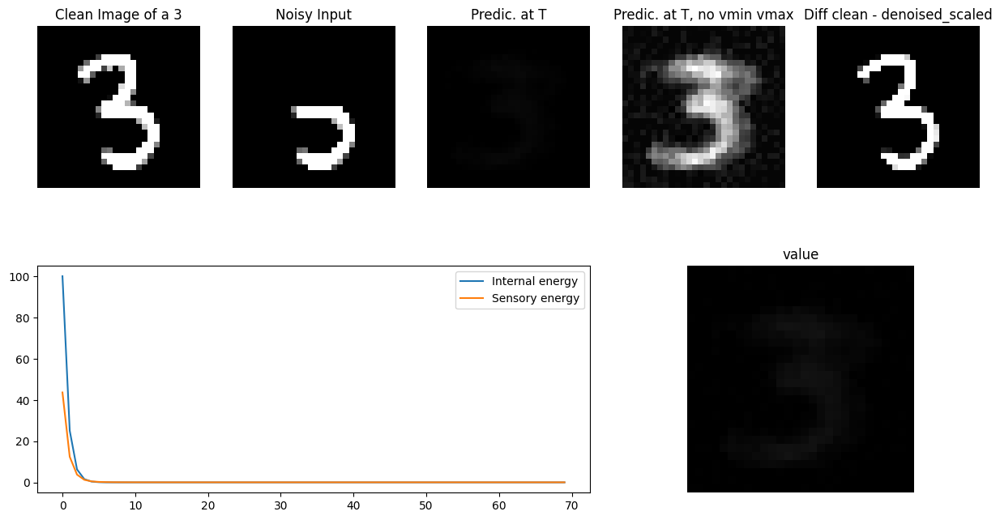

In [ ]:
model.pc_conv1.debug = False
model.pc_conv1.T = 100
# model.pc_conv1.lr_gamma = 10
# model.pc_conv1.lr_alpha = 10

model.pc_conv1.set_mode("testing", task="reconstruction")


# SINCE DOING OCCLUSION; we set the first half of the sensory_img to black, but we need to still condition on the visible second part of the image, so we dont update those



model.pc_conv1.nodes_2_update = list(model.pc_conv1.sensory_indices[len(model.pc_conv1.sensory_indices)//2:]) +  list(model.pc_conv1.internal_indices)



# model.pc_conv1.nodes_2_update +=  list(model.pc_conv1.supervised_labels)


model.pc_conv1.batchsize = 1

print("model.pc_conv1.values.shape", model.pc_conv1.values.shape)
model.pc_conv1.restart_activity()


batch_idx = 0.


model.pc_conv1.debug = False
model.pc_conv1.T = 70
model.pc_conv1.set_mode("testing", task="reconstruction")
model.pc_conv1.batchsize = 1

print("model.pc_conv1.values.shape", model.pc_conv1.values.shape)

batch_idx = 0

print("No vmin vmax")
for idx, (noisy_batch, clean_image) in enumerate(test_loader):

    # noisy_batch, clean_image = noisy_batch[0], clean_image[0]
    print(noisy_batch.y)

    model.pc_conv1.restart_activity()

    # Perform inference to denoise
    noisy_batch = noisy_batch.to(device)    

    # TEST: set x of noisy_batch to equal all zeros
    # noisy_batch.x += torch.rand(noisy_batch.x.shape).to(device)
    print("X shape", noisy_batch.x.shape)

    # set bottom half of the image to zero
    # print("Make occuled")

    # model.pc_conv1.set_sensory_nodes(noisy_batch.x)

    #### SURVERVISED ##########

    noisy_batch.x[:, 0][model.pc_conv1.internal_indices] = torch.rand(noisy_batch.x[:, 0][model.pc_conv1.internal_indices].shape).to(model.pc_conv1.device)
    

    if dataset_params["supervised_learning"]:
        print("labels dataloader", noisy_batch.x.view(-1)[model.pc_conv1.supervised_labels])
        one_hot = torch.zeros(10, device=device)
        
        
        one_hot[noisy_batch.y] = 1 
        one_hot[noisy_batch.y] = 0 

        one_hot = one_hot.view(-1, 1)
        print(model.pc_conv1.values.data[supervised_labels].shape,  one_hot.shape)
        model.pc_conv1.values.data[supervised_labels] = one_hot

        # for i in model.pc_conv1.supervised_labels: 
        #     model.pc_conv1.values.data[i] = noisy_batch.x.view(-1)[i]
        
        # model.pc_conv1.values[model.pc_conv1.supervised_labels].data = noisy_batch.x[model.pc_conv1.supervised_labels]
        
    
    print("labels model", model.pc_conv1.values[model.pc_conv1.supervised_labels])
    
    # model.inference()
    
    # remove label
    # noisy_batch.x[:, 0][-10:] = 0

    # noisy_batch.x[:, 0][0:784] += 2 * torch.rand(noisy_batch.x[:, 0][0:784].shape).to(device)

    # Extract the denoised output from the sensory nodes

    
    noisy_batch.x[:, 0][0:784 // 2 ] = 0 

    noisy_image = noisy_batch.x[:, 0][0:784].view(28,28).cpu().detach().numpy()
    
    
    values, predictions, labels = model.query(method="pass", data=noisy_batch)  # query_by_conditioning
    # values, predictions = values[batch_idx, :, 0], predictions[batch_idx, :, 0]
    
    denoised_output = predictions[0:784].view(28,28).cpu().detach().numpy()

    # denoised_output = model.reconstruction().view(28,28).cpu().detach().numpy()

    clean_image = clean_image.view(28,28).cpu().numpy()  # Adjust shape as necessary

    # all cmaps starting with Red, blue with
    # maps = RdBu, RdBu_r, RdBu_r, RdBu, BrBG, BrBG_r, coolwarm, coolwarm_r, bwr, bwr_r, seismic, seismic_r
    # cmap = "RdBu_r"
    cmap = "gray"
    
    # Creating a subplot mosaic
    fig, ax = plt.subplot_mosaic([
        ["A", "B", "C", "D", "E"],
        ["F", "F", "F", "G", "G"]
    ], figsize=(15, 8))

    # Plotting the images
    ax["A"].imshow(clean_image, vmin=0, vmax=1, cmap=cmap)
    ax["A"].set_title(f"Clean Image of a {noisy_batch.y.item()}")

    ax["B"].imshow(noisy_image, vmin=0, vmax=1, cmap=cmap)
    ax["B"].set_title("Noisy Input")

    ax["C"].imshow(denoised_output, vmin=0, vmax=1, cmap=cmap)
    ax["C"].set_title("Predic. at T")

    ax["D"].imshow(denoised_output, cmap=cmap)
    ax["D"].set_title("Predic. at T, no vmin vmax")
    print("Predic. at T, no vmin vmax", max(denoised_output.flatten()), min(denoised_output.flatten()))

    denoised_output_scaled = (denoised_output - min(denoised_output.flatten())) / (max(denoised_output.flatten()) - min(denoised_output.flatten()))
    ax["E"].imshow(clean_image - denoised_output_scaled, vmin=0, vmax=1, cmap=cmap)
    ax["E"].set_title("Diff clean - denoised_scaled")
    print("Denoised val", max(values[0:784].view(28, 28).cpu().detach().numpy().flatten()), min(values[0:784].view(28, 28).cpu().detach().numpy().flatten()))

    for a in ["A", "B", "C", "D", "E", "G"]:
        ax[a].axis('off')

    # Plotting the line graphs
    ax["F"].plot(model.pc_conv1.energy_vals["internal_energy"][-model.pc_conv1.T:], label="Internal energy")
    ax["F"].plot(model.pc_conv1.energy_vals["sensory_energy"][-model.pc_conv1.T:], label="Sensory energy")  # Replace with actual values
    ax["F"].legend()


    ax["G"].imshow(values[0:784].view(28,28).cpu().detach().numpy(), vmin=0, vmax=1, cmap=cmap)
    ax["G"].set_title("value")


    # fig.savefig(f'{model_dir}/reconstruction/recon_T_{model.pc_conv1.T}_{noisy_batch.y.item()}.png')

    labels = values[model.pc_conv1.supervised_labels]
    print("labels", labels)

    difference_image = clean_image - denoised_output_scaled

    break


# Generation

-------------modetesting--------------
-------------taskgeneration--------------
model.pc_conv1.values.shape torch.Size([3194, 1])
-------------Restarting activity (weights/pred/errors/values)--------------
No vmin vmax
Selected idx:  259
adding label 5 tensor([ 0.,  0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.])
tensor([5])
torch.Size([3194, 3, 1])
omitting setting sensory nodes
labels before torch.Size([10]) tensor([0.0000, 0.0000, 0.4255, 0.0000, 0.0000, 0.5893, 0.0000, 0.0000, 0.2406,
        0.0000], device='cuda:0')
labels after tensor([0.0000, 0.0000, 0.4255, 0.0000, 0.0000, 0.5893, 0.0000, 0.0000, 0.2406,
        0.0000], device='cuda:0')
tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
aaa testing
CHECK tensor([[ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [10.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.]], device='cuda:0')
---

Inference completed.
QUery by condition or query by init
CHECK tensor([[ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [10.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.]], device='cuda:0')
Predic. at T, no vmin vmax 0.018817965 -0.00039006595
Denoised val 0.03884495 -0.0031195404
generation_task_5.png
CHECK tensor([[ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.],
        [10.],
        [ 0.],
        [ 0.],
        [ 0.],
        [ 0.]], device='cuda:0')


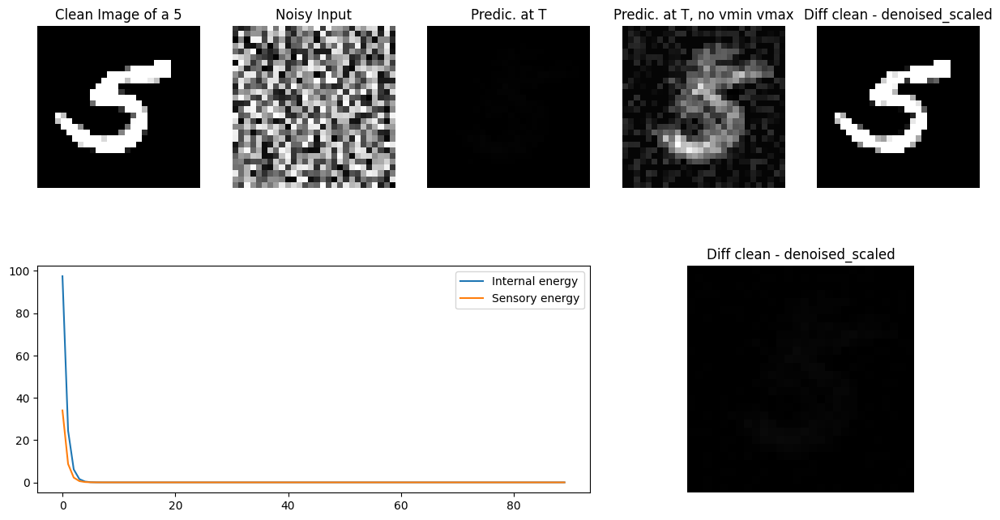

In [ ]:

# model.pc_conv1.task = 'reconstruction'
model.pc_conv1.debug = False
model.pc_conv1.T = 90
# model.pc_conv1.T = 

# model.pc_conv1.gamma += 0.5 
# model.pc_conv1.alpha -= 1


model.pc_conv1.lr_values = model_params['lr_params'][0]
model.pc_conv1.mode = "testing"
model.pc_conv1.set_mode("testing", task="generation")

# model.pc_conv1.mode = "training"
# model.pc_conv1.set_mode("training")

 
print("model.pc_conv1.values.shape", model.pc_conv1.values.shape)
model.pc_conv1.restart_activity()

batch_idx = 0

print("No vmin vmax")
for idx, (noisy_batch, clean_image) in enumerate(test_loader):

    # noisy_batch, clean_image = noisy_batch[0], clean_image[0]
    print(noisy_batch.y)

    # Perform inference to denoise
    noisy_batch = noisy_batch.to(device)

    # TEST: set x of noisy_batch to equal all zeros
    # noisy_batch.x = torch.rand(noisy_batch.x.shape).to(device)
    print(noisy_batch.x.shape)

    # set bottom half of the image to zero
    # print("Make occuled")
    # noisy_batch.x[0:784//2] = 0

    # set sensory
    
    # noisy_batch.x[0:784//2] = torch.zeros_like(noisy_batch.x[0:784//2])
    # model.pc_conv1.set_sensory_nodes(noisy_batch.x)

    noisy_batch.x[:, 0][model.pc_conv1.internal_indices] = torch.rand(noisy_batch.x[:, 0][model.pc_conv1.internal_indices].shape).to(model.pc_conv1.device)

    
    print("omitting setting sensory nodes")

    white = torch.ones_like(noisy_batch.x)
    black = torch.zeros_like(noisy_batch.x[:, 0][0:-10])

    random = torch.rand(noisy_batch.x[:, 0][model.pc_conv1.sensory_indices].shape).to(model.pc_conv1.device) 

    # self.values, self.errors, self.predictions, = self.data.x[:, 0], self.data.x[:, 1], self.data.x[:, 2]

    # noisy_batch.x[:, 0] = random
    noisy_batch.x[:, 0][model.pc_conv1.sensory_indices] = random
    # noisy_batch.x[:, 0][0:-10] = 
    
    # print("aa", noisy_batch.x[:, 0].shape)
    # model.pc_conv1.set_sensory_nodes(noisy_batch.x)
    # model.pc_conv1.set_sensory_nodes(random)
    # model.pc_conv1.set_sensory_nodes(white)

    # black[30:60] = 1
    # model.pc_conv1.set_sensory_nodes(black)

    # print("TST", noisy_batch.x.shape)
    # noisy_batch.x[sensory_indices] = 0
    # noisy_batch.x[sensory_indices] = 1
    
    if dataset_params["supervised_learning"]:
        a = noisy_batch.x.view(-1)[model.pc_conv1.supervised_labels]
        print("labels before", a.shape, a)

        one_hot = torch.zeros(10)
        one_hot[noisy_batch.y] = 1
        # one_hot[noisy_batch.y] = 0
        one_hot = one_hot.view(-1, 1)
        one_hot = one_hot.to(device)
        model.pc_conv1.values.data[model.pc_conv1.supervised_labels] = one_hot

        # for i in model.pc_conv1.supervised_labels: 
        #     model.pc_conv1.values.data[i] = noisy_batch.x.view(-1)[i]


        print("labels after", noisy_batch.x.view(-1)[model.pc_conv1.supervised_labels])
        print(model.pc_conv1.values.data[model.pc_conv1.supervised_labels])

    # model.pc_conv1.values[model.pc_conv1.supervised_labels] = noisy_batch.x[model.pc_conv1.supervised_labels]
    # model.inference()
    
    noisy_image = noisy_batch.x[:, 0][0:784].view(28,28).cpu().detach().numpy()

    print("aaa", model.pc_conv1.mode)
    # Extract the denoised output from the sensory nodes

    print("CHECK", noisy_batch.x[:,0][-10:])
    values, predictions, labels = model.query(method="pass", data=noisy_batch)  # query_by_conditioning
    # values, predictions = values[batch_idx, :, 0], predictions[batch_idx, :, 0]
    print("CHECK", noisy_batch.x[:,0][-10:])
    
    denoised_output = predictions[0:784].view(28,28).cpu().detach().numpy()

    # denoised_output = model.reconstruction().view(28,28).cpu().detach().numpy()

    clean_image = clean_image.view(28,28).cpu().numpy()  # Adjust shape as necessary

    # all cmaps starting with Red, blue with
    # maps = RdBu, RdBu_r, RdBu_r, RdBu, BrBG, BrBG_r, coolwarm, coolwarm_r, bwr, bwr_r, seismic, seismic_r
    # cmap = "RdBu_r"
    cmap = "gray"

    # Plotting both images side by side
   
    # Creating a subplot mosaic
    fig, ax = plt.subplot_mosaic([
        ["A", "B", "C", "D", "E"],
        ["F", "F", "F", "G", "G"]
    ], figsize=(15, 8))

    # Plotting the images
    ax["A"].imshow(clean_image, vmin=0, vmax=1, cmap=cmap)
    ax["A"].set_title(f"Clean Image of a {noisy_batch.y.item()}")

    ax["B"].imshow(noisy_image, vmin=0, vmax=1, cmap=cmap)
    ax["B"].set_title("Noisy Input")

    ax["C"].imshow(denoised_output, vmin=0, vmax=1, cmap=cmap)
    ax["C"].set_title("Predic. at T")

    ax["D"].imshow(denoised_output, cmap=cmap)
    ax["D"].set_title("Predic. at T, no vmin vmax")
    print("Predic. at T, no vmin vmax", max(denoised_output.flatten()), min(denoised_output.flatten()))

    denoised_output_scaled = (denoised_output - min(denoised_output.flatten())) / (max(denoised_output.flatten()) - min(denoised_output.flatten()))
    ax["E"].imshow(clean_image - denoised_output_scaled, vmin=0, vmax=1, cmap=cmap)
    ax["E"].set_title("Diff clean - denoised_scaled")
    print("Denoised val", max(values[0:784].view(28, 28).cpu().detach().numpy().flatten()), min(values[0:784].view(28, 28).cpu().detach().numpy().flatten()))

    for a in ["A", "B", "C", "D", "E", "G"]:
        ax[a].axis('off')

    # Plotting the line graphs
    ax["F"].plot(model.pc_conv1.energy_vals["internal_energy"][-model.pc_conv1.T:], label="Internal energy")
    ax["F"].plot(model.pc_conv1.energy_vals["sensory_energy"][-model.pc_conv1.T:], label="Sensory energy")  # Replace with actual values
    ax["F"].legend()


    ax["G"].imshow(values[0:784].view(28,28).cpu().detach().numpy(), vmin=0, vmax=1, cmap=cmap)
    ax["G"].set_title("Diff clean - denoised_scaled")

    # fig.savefig(f'{model_dir}/generation/generation_condition_label_T_{model.pc_conv1.T}_{noisy_batch.y.item()}.png')

    # save 
    print(f"generation_task_{noisy_batch.y.item()}.png")
    # plt.savefig(f"generation_task_{noisy_batch.y.item()}.png")        

    labels = values[model.pc_conv1.supervised_labels]

    # print(model.pc_conv1.values.data[model.pc_conv1.supervised_labels] )
    # print(labels)

    print("CHECK", noisy_batch.x[:,0][-10:])


    break


# Query by conditioning: --> only giving one-hot label


-------------modetesting--------------
-------------taskclassification--------------
model.pc_conv1.values.shape torch.Size([3194, 1])
-------------Restarting activity (weights/pred/errors/values)--------------
model.pc_conv1.values.shape torch.Size([3194, 1])
No vmin vmax
Selected idx:  185
adding label 7 tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0., 10.,  0.,  0.])
tensor([7])
-------------Restarting activity (weights/pred/errors/values)--------------
torch.Size([3194, 3, 1])
torch.Size([10, 1]) torch.Size([10, 1])
CHECK tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
----------------reconstruction-----------------
TASK IS classification
Pass


Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 2.7681296 -0.8342289
Denoised val 2.8087585 -0.42421296
tensor([ 0.7827,  0.2620, -0.0023,  0.4868,  0.6235,  0.3964,  0.5130,  1.3479,
         0.5069,  0.5857], device='cuda:0')
generation_task_7.png
tensor([ 0.7827,  0.2620, -0.0023,  0.4868,  0.6235,  0.3964,  0.5130,  1.3479,
         0.5069,  0.5857], device='cuda:0')
tensor([[ 0.7827],
        [ 0.2620],
        [-0.0023],
        [ 0.4868],
        [ 0.6235],
        [ 0.3964],
        [ 0.5130],
        [ 1.3479],
        [ 0.5069],
        [ 0.5857]], device='cuda:0')
tensor([0.1186, 0.0705, 0.0541, 0.0882, 0.1012, 0.0806, 0.0906, 0.2088, 0.0900,
        0.0974], device='cuda:0')
tensor(7)
Selected idx:  125
adding label 8 tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 10.,  0.])
tensor([8])
-------------Restarting activity (weights/pred/errors/values)--------------
torch.Size([3194, 3, 1])
torch.Size([10, 1]) torch.Size([10, 1])
CHECK tensor

Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 2.596904 -0.94311583
Denoised val 2.8214867 -0.42421296
tensor([0.7685, 0.7454, 0.0071, 1.1912, 0.3637, 0.8732, 0.8524, 0.3462, 1.1850,
        0.4272], device='cuda:0')
generation_task_8.png
tensor([0.7685, 0.7454, 0.0071, 1.1912, 0.3637, 0.8732, 0.8524, 0.3462, 1.1850,
        0.4272], device='cuda:0')
tensor([[0.7685],
        [0.7454],
        [0.0071],
        [1.1912],
        [0.3637],
        [0.8732],
        [0.8524],
        [0.3462],
        [1.1850],
        [0.4272]], device='cuda:0')
tensor([0.1029, 0.1006, 0.0481, 0.1570, 0.0686, 0.1143, 0.1119, 0.0675, 0.1561,
        0.0731], device='cuda:0')
tensor(3)
Selected idx:  139
adding label 4 tensor([ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.])
tensor([4])
-------------Restarting activity (weights/pred/errors/values)--------------
torch.Size([3194, 3, 1])
torch.Size([10, 1]) torch.Size([10, 1])
CHECK tensor([[0.],
        [0.],
        

Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 2.7609777 -0.9129565
Denoised val 2.8214867 -0.42421296
tensor([0.3669, 0.3443, 0.0025, 0.4401, 1.0080, 0.5440, 0.9697, 0.6645, 0.7441,
        0.5539], device='cuda:0')
generation_task_4.png
tensor([0.3669, 0.3443, 0.0025, 0.4401, 1.0080, 0.5440, 0.9697, 0.6645, 0.7441,
        0.5539], device='cuda:0')
tensor([[0.3669],
        [0.3443],
        [0.0025],
        [0.4401],
        [1.0080],
        [0.5440],
        [0.9697],
        [0.6645],
        [0.7441],
        [0.5539]], device='cuda:0')
tensor([0.0789, 0.0771, 0.0548, 0.0849, 0.1497, 0.0942, 0.1441, 0.1062, 0.1150,
        0.0951], device='cuda:0')
tensor(4)
Selected idx:  146
adding label 8 tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 10.,  0.])
tensor([8])
-------------Restarting activity (weights/pred/errors/values)--------------
torch.Size([3194, 3, 1])
torch.Size([10, 1]) torch.Size([10, 1])
CHECK tensor([[0.],
        [0.],
        

Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 2.7247024 -0.93223286
Denoised val 2.8214867 -0.42421296
tensor([ 0.7989,  0.5176, -0.0018,  0.8864,  0.3776,  0.6315,  0.8538,  0.2724,
         1.0463,  0.2480], device='cuda:0')
generation_task_8.png
tensor([ 0.7989,  0.5176, -0.0018,  0.8864,  0.3776,  0.6315,  0.8538,  0.2724,
         1.0463,  0.2480], device='cuda:0')
tensor([[ 0.7989],
        [ 0.5176],
        [-0.0018],
        [ 0.8864],
        [ 0.3776],
        [ 0.6315],
        [ 0.8538],
        [ 0.2724],
        [ 1.0463],
        [ 0.2480]], device='cuda:0')
tensor([0.1205, 0.0909, 0.0541, 0.1315, 0.0790, 0.1019, 0.1273, 0.0711, 0.1543,
        0.0694], device='cuda:0')
tensor(8)
Selected idx:  136
adding label 3 tensor([ 0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.])
tensor([3])
-------------Restarting activity (weights/pred/errors/values)--------------
torch.Size([3194, 3, 1])
torch.Size([10, 1]) torch.Size([10, 1])
CHECK tenso

Inference completed.
QUery by condition or query by init
Predic. at T, no vmin vmax 2.6655216 -0.7658514
Denoised val 2.8214867 -0.42421296
tensor([0.3508, 0.4526, 0.0142, 1.2100, 0.2097, 0.7061, 0.3577, 0.1311, 0.3559,
        0.2900], device='cuda:0')
generation_task_3.png
tensor([0.3508, 0.4526, 0.0142, 1.2100, 0.2097, 0.7061, 0.3577, 0.1311, 0.3559,
        0.2900], device='cuda:0')
tensor([[0.3508],
        [0.4526],
        [0.0142],
        [1.2100],
        [0.2097],
        [0.7061],
        [0.3577],
        [0.1311],
        [0.3559],
        [0.2900]], device='cuda:0')
tensor([0.0890, 0.0986, 0.0636, 0.2102, 0.0773, 0.1270, 0.0896, 0.0715, 0.0895,
        0.0838], device='cuda:0')
tensor(3)
---------Done-----------------


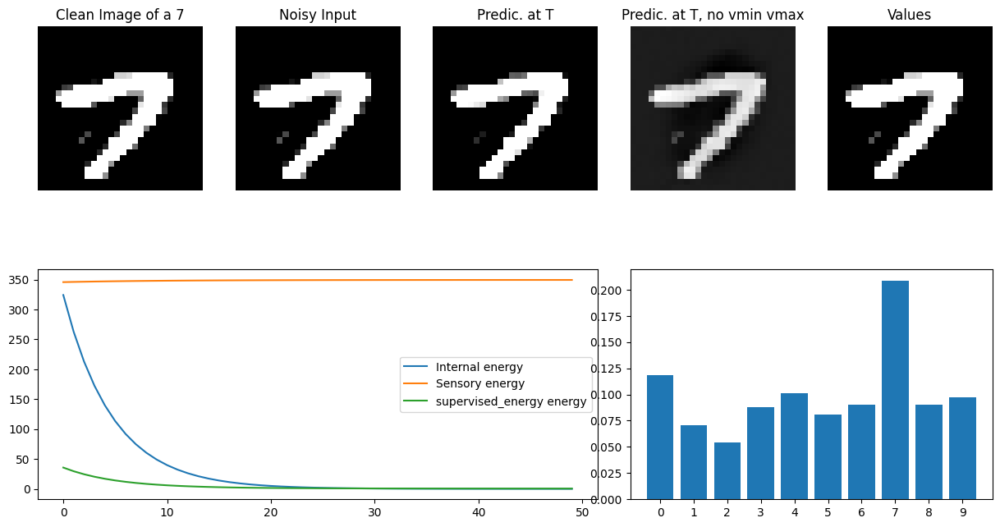

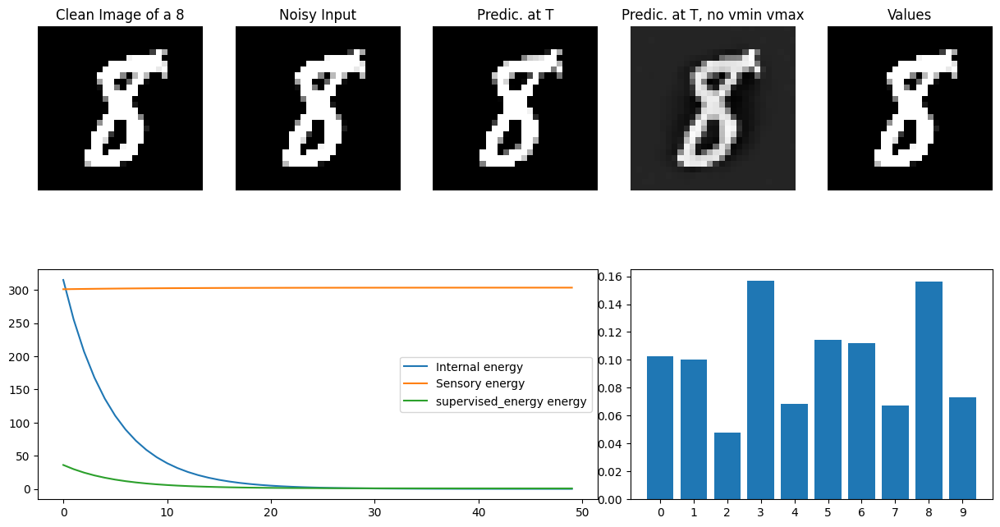

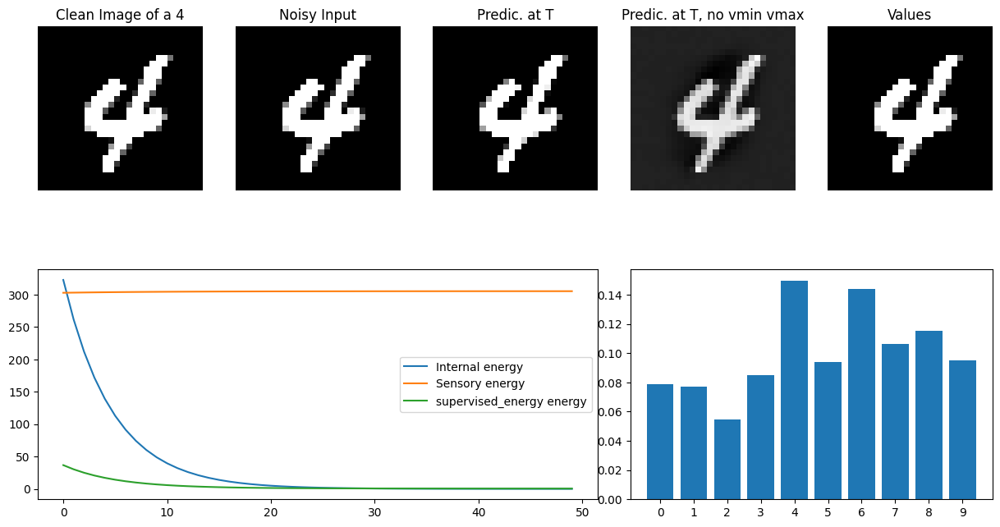

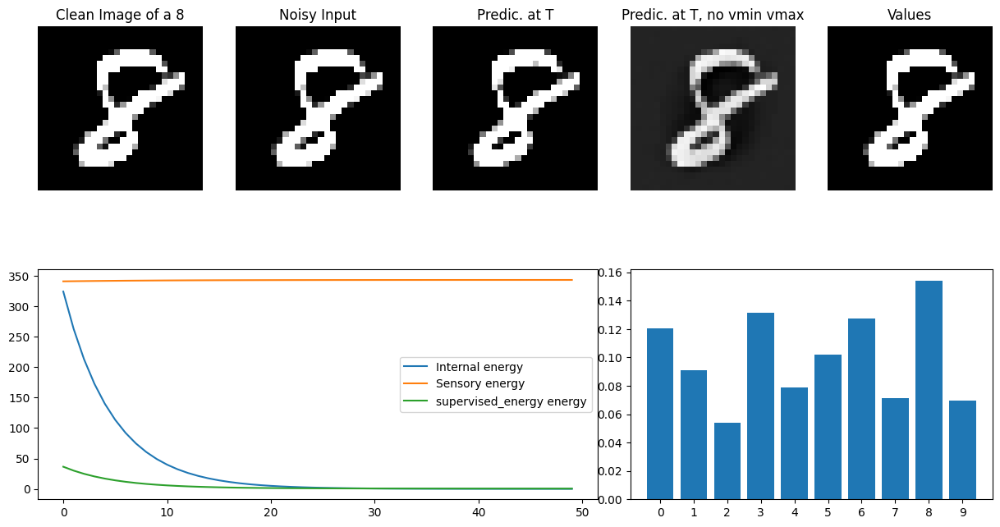

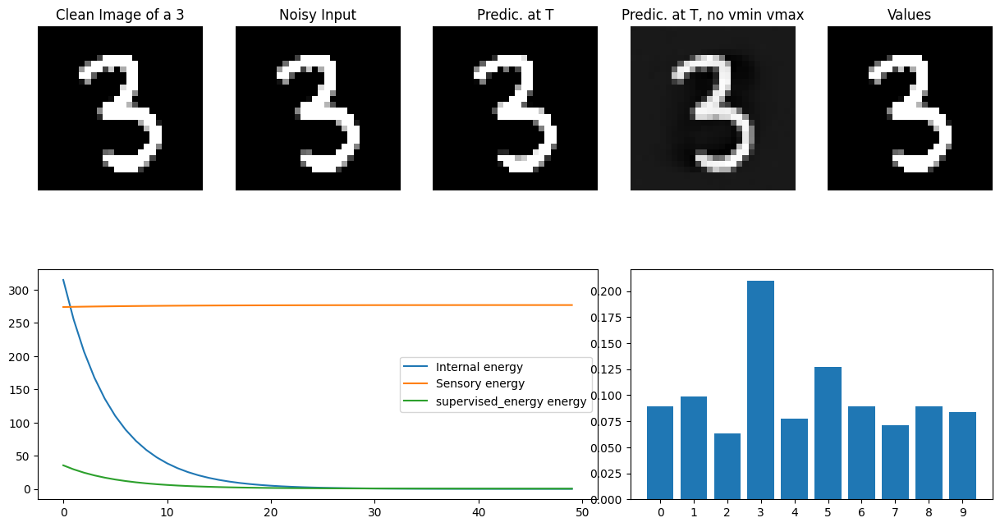

In [ ]:

model.pc_conv1.set_mode("testing", task="classification")

# model.pc_conv1.nodes_2_update += list(model.pc_conv1.sensory_indices) 


# custom_dataset_test = CustomGraphDataset(mnist_dataset=mnist_dataset_test, **dataset_params)
# test_loader = DataLoader(custom_dataset_test, batch_size=1, shuffle=True)

model.pc_conv1.batchsize = 1

print("model.pc_conv1.values.shape", model.pc_conv1.values.shape)
model.pc_conv1.restart_activity()


batch_idx = 0.


model.pc_conv1.debug = False
model.pc_conv1.T = 50



# LOOK
model.pc_conv1.lr_values = 0.1









# model.pc_conv1.set_mode("testing", task="reconstruction")
model.pc_conv1.batchsize = 1

print("model.pc_conv1.values.shape", model.pc_conv1.values.shape)

batch_idx = 0

y_pred, y_true = [], []

print("No vmin vmax")
for idx, (noisy_batch, clean_image) in enumerate(test_loader, start=1):

    # noisy_batch, clean_image = noisy_batch[0], clean_image[0]
    print(noisy_batch.y)

    model.pc_conv1.restart_activity()

    # Perform inference to denoise
    noisy_batch = noisy_batch.to(device)

    # TEST: set x of noisy_batch to equal all zeros
    # noisy_batch.x = torch.rand(noisy_batch.x.shape).to(device)
    print(noisy_batch.x.shape)

    # set bottom half of the image to zero
    # print("Make occuled")

    # model.pc_conv1.set_sensory_nodes(noisy_batch.x)

    #### SURVERVISED ##########

    if dataset_params["supervised_learning"]:
        # print("labels dataloader", noisy_batch.x.view(-1)[model.pc_conv1.supervised_labels])
        one_hot = torch.zeros(10, device=device)
        one_hot[noisy_batch.y] = 1 
        
        one_hot[noisy_batch.y] = 0 

        one_hot = one_hot.view(-1, 1)
        print(model.pc_conv1.values.data[supervised_labels].shape,  one_hot.shape)
        model.pc_conv1.values.data[supervised_labels] = one_hot

    #     # for i in model.pc_conv1.supervised_labels: 
    #     #     model.pc_conv1.values.data[i] = noisy_batch.x.view(-1)[i]
        
    #     # model.pc_conv1.values[model.pc_conv1.supervised_labels].data = noisy_batch.x[model.pc_conv1.supervised_labels]
        
    #     print("labels model", model.pc_conv1.values[model.pc_conv1.supervised_labels])
    
    # model.inference()
    
    print("CHECK",  model.pc_conv1.values.data[supervised_labels] )

    noisy_batch.x[:, 0][model.pc_conv1.internal_indices] = torch.rand(noisy_batch.x[:, 0][model.pc_conv1.internal_indices].shape).to(model.pc_conv1.device)

    # Extract the denoised output from the sensory nodes
    noisy_image = noisy_batch.x[:, 0][0:784].view(28,28).cpu().detach().numpy()
    
    
    values, predictions, labels = model.query(method="pass", data=noisy_batch)  # query_by_conditioning
    # values, predictions = values[batch_idx, :, 0], predictions[batch_idx, :, 0]
    

    denoised_output = predictions[0:784].view(28,28).cpu().detach().numpy()

    # denoised_output = model.reconstruction().view(28,28).cpu().detach().numpy()

    clean_image = clean_image.view(28,28).cpu().numpy()  # Adjust shape as necessary

    # all cmaps starting with Red, blue with
    # maps = RdBu, RdBu_r, RdBu_r, RdBu, BrBG, BrBG_r, coolwarm, coolwarm_r, bwr, bwr_r, seismic, seismic_r
    # cmap = "RdBu_r"
    cmap = "gray"
    
    # Creating a subplot mosaic
    fig, ax = plt.subplot_mosaic([
        ["A", "B", "C", "D", "E"],
        ["F", "F", "F", "G", "G"]
    ], figsize=(15, 8))

    # Plotting the images
    ax["A"].imshow(clean_image, vmin=0, vmax=1, cmap=cmap)
    ax["A"].set_title(f"Clean Image of a {noisy_batch.y.item()}")

    ax["B"].imshow(noisy_image, vmin=0, vmax=1, cmap=cmap)
    ax["B"].set_title("Noisy Input")

    ax["C"].imshow(denoised_output, vmin=0, vmax=1, cmap=cmap)
    ax["C"].set_title("Predic. at T")

    ax["D"].imshow(denoised_output, cmap=cmap)
    ax["D"].set_title("Predic. at T, no vmin vmax")
    print("Predic. at T, no vmin vmax", max(denoised_output.flatten()), min(denoised_output.flatten()))

    denoised_output_scaled = (denoised_output - min(denoised_output.flatten())) / (max(denoised_output.flatten()) - min(denoised_output.flatten()))
    # ax["E"].imshow(clean_image - denoised_output_scaled, vmin=0, vmax=1, cmap=cmap)
    # ax["E"].set_title("---")
    print("Denoised val", max(values[0:784].view(28, 28).cpu().detach().numpy().flatten()), min(values[0:784].view(28, 28).cpu().detach().numpy().flatten()))

    for a in ["A", "B", "C", "D", "E"]:
        ax[a].axis('off')

    # Plotting the line graphs
    ax["F"].plot(model.pc_conv1.energy_vals["internal_energy"][-model.pc_conv1.T:], label="Internal energy")
    ax["F"].plot(model.pc_conv1.energy_vals["sensory_energy"][-model.pc_conv1.T:], label="Sensory energy")  # Replace with actual values
    ax["F"].plot(model.pc_conv1.energy_vals["supervised_energy"][-model.pc_conv1.T:], label="supervised_energy energy")  # Replace with actual values 
    ax["F"].legend()


    ax["E"].imshow(values[0:784].view(28,28).cpu().detach().numpy(), vmin=0, vmax=1, cmap=cmap)
    ax["E"].set_title("Values")


    # fig.savefig(f'{model_dir}/reconstruction/recon_T_{model.pc_conv1.T}_{noisy_batch.y.item()}.png')

    labels = values[model.pc_conv1.supervised_labels].squeeze()
    print(labels)

    difference_image = clean_image - denoised_output_scaled

    


    # save 
    print(f"generation_task_{noisy_batch.y.item()}.png")
    # plt.savefig(f"generation_task_{noisy_batch.y.item()}.png")        

    print(labels)
    print(model.pc_conv1.values.data[model.pc_conv1.supervised_labels])

    softmax_labels = torch.nn.Softmax(dim=0)(labels)
    print(softmax_labels)

    if sum(labels) == 0:
        print("NO prediction on labels")
    else: 
        label_pred = torch.argmax(softmax_labels)
        label_pred = torch.arange(10)[label_pred]
        
        print(label_pred)

        ax["G"].bar([str(x) for x in range(10)], softmax_labels.cpu().detach().numpy())
        # plt.show()

    
    # fig_path = f'{model_dir}/classification/classification_{idx}_condition_label_T_{model.pc_conv1.T}_{noisy_batch.y.item()}.png'
    # fig.savefig(fig_path)

    # fig.savefig(f'{model_dir}/classification/classification_{idx}_condition_label_T_{model.pc_conv1.T}_{noisy_batch.y.item()}.png')

        # plt.savefig(f"generation_task_{noisy_batch.y.item()}.png")        

    # wandb.log({"classification_figure": wandb.Image(fig_path)})

    y_true.append(int(noisy_batch.y.item()))
    y_pred.append(int(label_pred.item()))


    if idx >= 5:
        break


    # softmax_labels_np = softmax_labels.cpu().detach().numpy()
    # probabilities = [softmax_prob.cpu().detach().numpy() for softmax_prob in softmax_labels]  # Assuming softmax_prob contains the probabilities

    # # Create data for the table
    # data = [[str(label), prob] for label, prob in zip(softmax_labels_np, probabilities)]

    # # Create a table
    # table = wandb.Table(data=data, columns=["Category", "Probability"])

    # # Create the bar plot
    # softmax_bar = wandb.plot.bar(
    #     table, "Category", "Probability", title="Softmax Probability Distribution"
    # )

    # classification_table.add_data(
    #     epoch,  # Assuming 'epoch' is defined elsewhere in your script
    #     noisy_batch.y.item(),
    #     label_pred.item(),
    #     wandb.Image(noisy_image, caption="Noisy Input"), 
    #     wandb.Image(denoised_output, caption="Predic. at T (vmin/max)"), 
    #     wandb.Image(values[0:784].view(28,28).cpu().detach().numpy(), caption="Value"),
    #     softmax_bar, 
    #     # wandb.Image(softmax_labels.cpu().detach().numpy(), caption="softmax")
    # )


# wandb.log({"classification_table": classification_table})


print("---------Done-----------------")


# test_loader

In [ ]:
list(zip(y_true, y_pred))
# Calculate accuracy
correct_predictions = sum(yt == yp for yt, yp in zip(y_true, y_pred))
total_predictions = len(y_true)
accuracy = correct_predictions / total_predictions
print("Accuracy:", accuracy)

Accuracy: 0.8


In [ ]:
list(zip(y_true, y_pred))

[(7, 1),
 (6, 6),
 (6, 6),
 (7, 3),
 (6, 6),
 (0, 0),
 (3, 3),
 (3, 3),
 (4, 3),
 (3, 3),
 (3, 3),
 (6, 6),
 (6, 6),
 (3, 3),
 (5, 6),
 (7, 6),
 (3, 3),
 (6, 6),
 (7, 7),
 (0, 0),
 (3, 3),
 (4, 0),
 (1, 1),
 (3, 3),
 (1, 1),
 (3, 3),
 (3, 3),
 (5, 5),
 (7, 7),
 (6, 6),
 (0, 0),
 (0, 0),
 (0, 0),
 (0, 0),
 (6, 6),
 (1, 1),
 (5, 5),
 (7, 0),
 (5, 5),
 (0, 0)]

In [ ]:
# Calculate accuracy
correct_predictions = sum(yt == yp for yt, yp in zip(y_true, y_pred))
total_predictions = len(y_true)
accuracy = correct_predictions / total_predictions
print("Accuracy:", accuracy)

Accuracy: 0.825


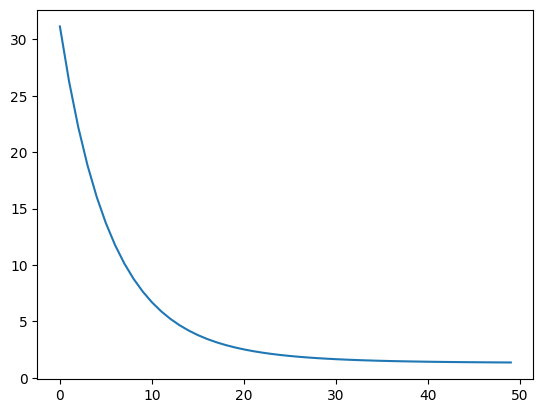

In [ ]:
plt.plot(model.pc_conv1.energy_vals["supervised_energy"][-model.pc_conv1.T:], label="supervised nodes energy")

In [ ]:
model.pc_conv1.errors[-10 :, :]

tensor([[5.3941e-01],
        [6.1069e-01],
        [3.2547e-04],
        [1.1861e+00],
        [2.4430e-01],
        [5.2823e-01],
        [4.7816e-01],
        [2.8973e-01],
        [1.0932e-04],
        [8.9173e-03]], device='cuda:0')

In [ ]:
# [str(x) for x in range(10)] 
softmax_labels.squeeze()

tensor([0.1473, 0.0856, 0.0332, 0.3735, 0.0525, 0.0968, 0.0876, 0.0560, 0.0333,
        0.0341], device='cuda:0')